# Autoencoder Embeddings for Adaptive Model Selection and Drift Detection

As part of my bachelor thesis, this notebook explores how autoencoder-derived embeddings can be used to dynamically select the most suitable forecasting model, in contrast to conventional approaches based on raw time-domain similarity. Concept drift detection is handled in a separate notebook.

---

### RQ1: Latent vs. Raw Space for Model Selection
- [Test 1.1: Forecasting MSE Comparison](#test-11-forecasting-mse-comparison)
- [Test 1.2: Win Rate Analysis](#test-12-win-rate-analysis)
- [Test 1.3: Neighbor-Set Overlap](#test-13-neighbor-set-overlap)
### RQ2: Cluster-Based Latent Selection
- [Test 2.1: Forecasting MSE Comparison](#test-21-forecasting-mse-comparison)
- [Test 2.2: Visualization](#test-22-visualization)

### Imports

In [1]:
import os
import time
import math
import random
import pickle
import shutil
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from aeon.visualisation import plot_critical_difference
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

from forecasters import *
from autoencoder import *
from utils import *
from data import *

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

### Seeding

In [2]:
# Set a global seed for reproducibility
seed = 42

# Seed Python, NumPy, and PyTorch RNGs
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

# Create and seed a PyTorch Generator (for Dataloaders)
g= torch.Generator()
g.manual_seed(seed)

# Seed CUDA (if available)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Ensure deterministic behavior in cuDNN
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

### Configuration Setup

Defines experiment parameters, including autoencoder bottleneck size, datasets (with length and window size), and distance metrics. The compute device (CPU/GPU) is selected automatically.

The experiment is conducted using four distinct datasets:
- **Energy Dataset:** Electricity consumption of a single client aggregated to 3-hour intervals (2012–2014); captures regular usage cycles. 
- **River Flow Dataset:** Daily mean flow of the Saugeen River (1915–1979, 23,741 days); strong seasonality and long-term dependencies.
- **Temperatures Dataset:** Daily minimum temperatures in Melbourne (1981–1990, 3650 days); smooth seasonal cycles with mild variability.
- **Births Dataset:** Daily US birth counts from 1969 to 1988 (7305 days); low variability and weak seasonality.

In [3]:
# Directory paths for saving and loading components
AE_DIR = "trained_autoencoders"
FORECASTERS_DIR= "trained_forecasters"
RESULTS_DIR = "results"

# Size of the autoencoder bottleneck
latent_dim = 2

# Dataset configurations: (Name, Class, Sequence Length, Window Size)
ts_configs = [
    ("Temperatures",  Temperatures,  None, 10),
    ("Births",        Births,        None, 10),
    ("SolarPower",    Solar,         None, 10),
    ("WindPower",     Wind,          None, 10),
    ("ExchangeRate",  ExchangeRate,  None, 10),
    ("Treasury",      Treasury,      None, 10),
    ("WindSpeed",     WindSpeed,     None, 10),
    ("Air Quality",   Air,           None, 10),
]

# Flags to toggle use of autoencoder embeddings
autoencoder_embedding_flags = [False, True]

# Distance metrics to evaluate
metrics_list = ["dtw", "euclidean", "cosine", "manhattan"]

# Set device for computation (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


### Autoencoder Training and Evaluation

For each dataset, a convolutional autoencoder is trained on windowed time-series data using MSE loss. The model is trained for 30 epochs and saved for later use.


Training AE on Temperatures (window_size=10)
  Epoch 1/30 — loss: 0.747361
  Epoch 2/30 — loss: 0.382695
  Epoch 3/30 — loss: 0.306744
  Epoch 4/30 — loss: 0.258169
  Epoch 5/30 — loss: 0.229577
  Epoch 6/30 — loss: 0.210523
  Epoch 7/30 — loss: 0.194445
  Epoch 8/30 — loss: 0.188898
  Epoch 9/30 — loss: 0.178199
  Epoch 10/30 — loss: 0.168945
  Epoch 11/30 — loss: 0.162183
  Epoch 12/30 — loss: 0.157534
  Epoch 13/30 — loss: 0.154796
  Epoch 14/30 — loss: 0.143756
  Epoch 15/30 — loss: 0.145691
  Epoch 16/30 — loss: 0.148269
  Epoch 17/30 — loss: 0.132350
  Epoch 18/30 — loss: 0.132302
  Epoch 19/30 — loss: 0.127725
  Epoch 20/30 — loss: 0.125129
  Epoch 21/30 — loss: 0.118310
  Epoch 22/30 — loss: 0.121899
  Epoch 23/30 — loss: 0.119171
  Epoch 24/30 — loss: 0.119284
  Epoch 25/30 — loss: 0.120336
  Epoch 26/30 — loss: 0.113037
  Epoch 27/30 — loss: 0.112960
  Epoch 28/30 — loss: 0.107184
  Epoch 29/30 — loss: 0.108005
  Epoch 30/30 — loss: 0.098413
Saved AE: trained_autoencoders\ae

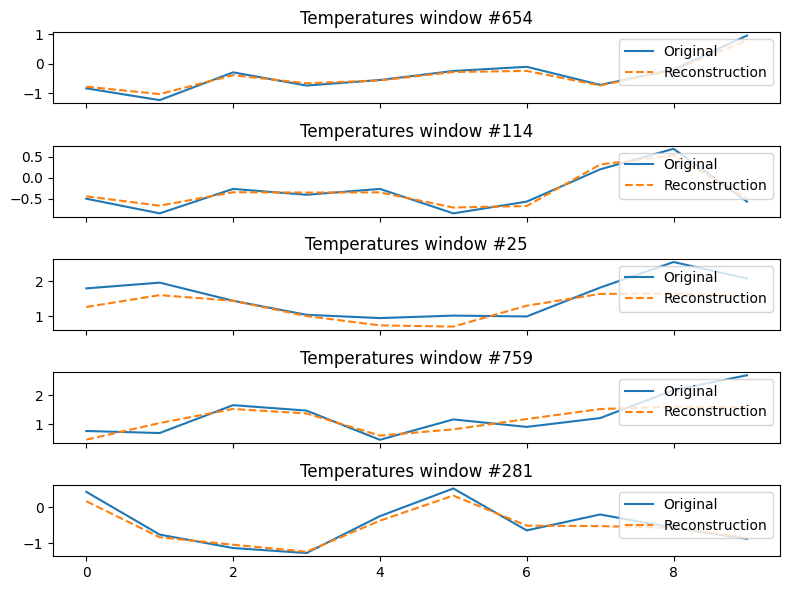


Training AE on Births (window_size=10)
  Epoch 1/30 — loss: 0.628070
  Epoch 2/30 — loss: 0.269937
  Epoch 3/30 — loss: 0.209534
  Epoch 4/30 — loss: 0.180847
  Epoch 5/30 — loss: 0.164337
  Epoch 6/30 — loss: 0.155194
  Epoch 7/30 — loss: 0.144088
  Epoch 8/30 — loss: 0.135117
  Epoch 9/30 — loss: 0.124453
  Epoch 10/30 — loss: 0.119667
  Epoch 11/30 — loss: 0.111257
  Epoch 12/30 — loss: 0.109858
  Epoch 13/30 — loss: 0.104713
  Epoch 14/30 — loss: 0.101509
  Epoch 15/30 — loss: 0.093771
  Epoch 16/30 — loss: 0.096044
  Epoch 17/30 — loss: 0.092058
  Epoch 18/30 — loss: 0.089194
  Epoch 19/30 — loss: 0.087778
  Epoch 20/30 — loss: 0.086277
  Epoch 21/30 — loss: 0.080901
  Epoch 22/30 — loss: 0.083165
  Epoch 23/30 — loss: 0.077604
  Epoch 24/30 — loss: 0.079101
  Epoch 25/30 — loss: 0.072544
  Epoch 26/30 — loss: 0.072155
  Epoch 27/30 — loss: 0.070515
  Epoch 28/30 — loss: 0.076071
  Epoch 29/30 — loss: 0.067846
  Epoch 30/30 — loss: 0.067375
Saved AE: trained_autoencoders\ae_Birth

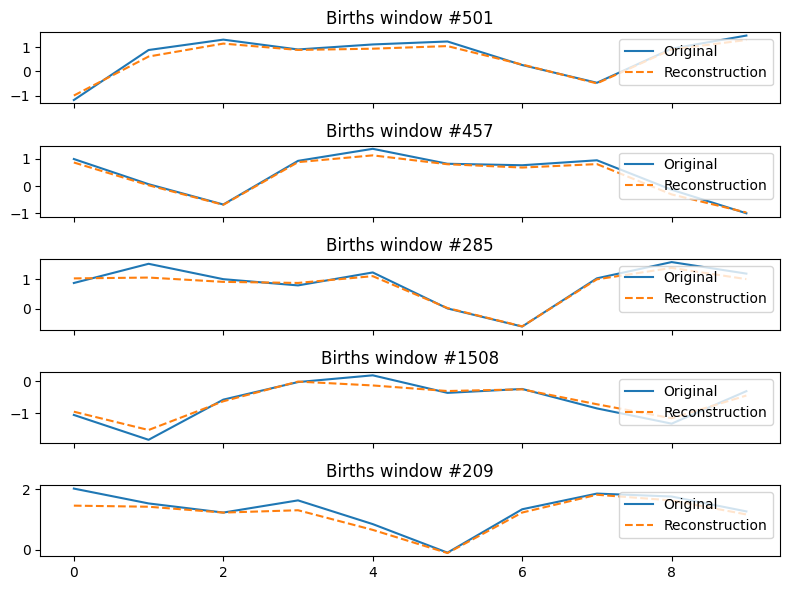


Training AE on SolarPower (window_size=10)
  Epoch 1/30 — loss: 0.585779
  Epoch 2/30 — loss: 0.232767
  Epoch 3/30 — loss: 0.182365
  Epoch 4/30 — loss: 0.153134
  Epoch 5/30 — loss: 0.134436
  Epoch 6/30 — loss: 0.122453
  Epoch 7/30 — loss: 0.116099
  Epoch 8/30 — loss: 0.108016
  Epoch 9/30 — loss: 0.101429
  Epoch 10/30 — loss: 0.094927
  Epoch 11/30 — loss: 0.091103
  Epoch 12/30 — loss: 0.088730
  Epoch 13/30 — loss: 0.086281
  Epoch 14/30 — loss: 0.084492
  Epoch 15/30 — loss: 0.080379
  Epoch 16/30 — loss: 0.079480
  Epoch 17/30 — loss: 0.078108
  Epoch 18/30 — loss: 0.075719
  Epoch 19/30 — loss: 0.074065
  Epoch 20/30 — loss: 0.072192
  Epoch 21/30 — loss: 0.070449
  Epoch 22/30 — loss: 0.068709
  Epoch 23/30 — loss: 0.067496
  Epoch 24/30 — loss: 0.064773
  Epoch 25/30 — loss: 0.063928
  Epoch 26/30 — loss: 0.064028
  Epoch 27/30 — loss: 0.064145
  Epoch 28/30 — loss: 0.063852
  Epoch 29/30 — loss: 0.061897
  Epoch 30/30 — loss: 0.059932
Saved AE: trained_autoencoders\ae_S

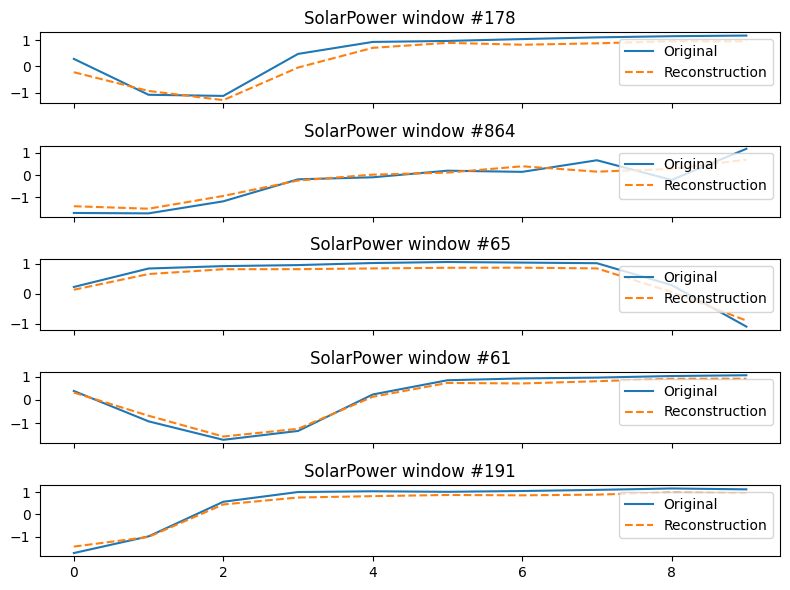


Training AE on WindPower (window_size=10)
  Epoch 1/30 — loss: 0.307416
  Epoch 2/30 — loss: 0.136304
  Epoch 3/30 — loss: 0.116334
  Epoch 4/30 — loss: 0.096794
  Epoch 5/30 — loss: 0.086696
  Epoch 6/30 — loss: 0.075911
  Epoch 7/30 — loss: 0.089441
  Epoch 8/30 — loss: 0.074104
  Epoch 9/30 — loss: 0.071616
  Epoch 10/30 — loss: 0.081036
  Epoch 11/30 — loss: 0.077604
  Epoch 12/30 — loss: 0.064407
  Epoch 13/30 — loss: 0.059865
  Epoch 14/30 — loss: 0.067192
  Epoch 15/30 — loss: 0.058839
  Epoch 16/30 — loss: 0.052283
  Epoch 17/30 — loss: 0.058542
  Epoch 18/30 — loss: 0.056452
  Epoch 19/30 — loss: 0.049859
  Epoch 20/30 — loss: 0.048316
  Epoch 21/30 — loss: 0.049327
  Epoch 22/30 — loss: 0.063063
  Epoch 23/30 — loss: 0.061680
  Epoch 24/30 — loss: 0.065967
  Epoch 25/30 — loss: 0.054633
  Epoch 26/30 — loss: 0.078150
  Epoch 27/30 — loss: 0.059780
  Epoch 28/30 — loss: 0.064080
  Epoch 29/30 — loss: 0.053350
  Epoch 30/30 — loss: 0.055418
Saved AE: trained_autoencoders\ae_Wi

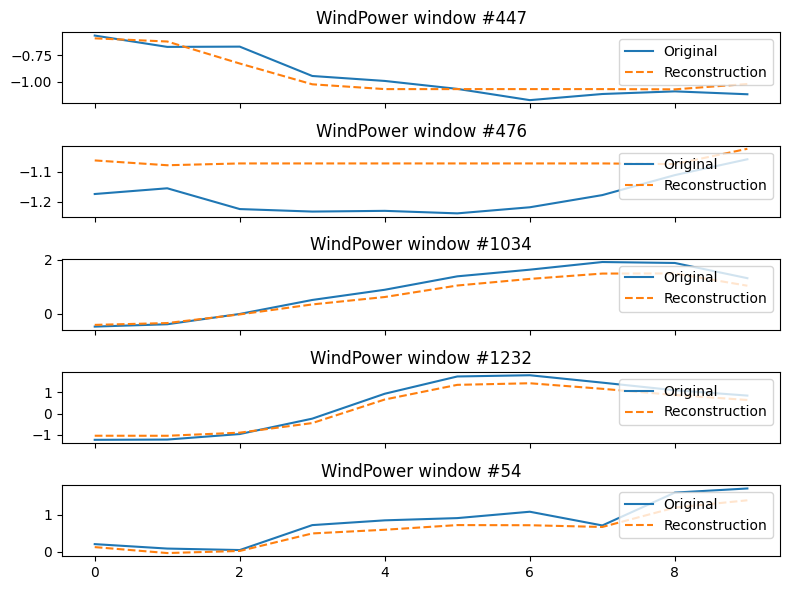


Training AE on ExchangeRate (window_size=10)
  Epoch 1/30 — loss: 0.333333
  Epoch 2/30 — loss: 0.110869
  Epoch 3/30 — loss: 0.076250
  Epoch 4/30 — loss: 0.066134
  Epoch 5/30 — loss: 0.054269
  Epoch 6/30 — loss: 0.045996
  Epoch 7/30 — loss: 0.044149
  Epoch 8/30 — loss: 0.041829
  Epoch 9/30 — loss: 0.037234
  Epoch 10/30 — loss: 0.036727
  Epoch 11/30 — loss: 0.035451
  Epoch 12/30 — loss: 0.032702
  Epoch 13/30 — loss: 0.038700
  Epoch 14/30 — loss: 0.035498
  Epoch 15/30 — loss: 0.031588
  Epoch 16/30 — loss: 0.034111
  Epoch 17/30 — loss: 0.029821
  Epoch 18/30 — loss: 0.031089
  Epoch 19/30 — loss: 0.028603
  Epoch 20/30 — loss: 0.030991
  Epoch 21/30 — loss: 0.030281
  Epoch 22/30 — loss: 0.030976
  Epoch 23/30 — loss: 0.031904
  Epoch 24/30 — loss: 0.030437
  Epoch 25/30 — loss: 0.029968
  Epoch 26/30 — loss: 0.028188
  Epoch 27/30 — loss: 0.033080
  Epoch 28/30 — loss: 0.029259
  Epoch 29/30 — loss: 0.028628
  Epoch 30/30 — loss: 0.026491
Saved AE: trained_autoencoders\ae

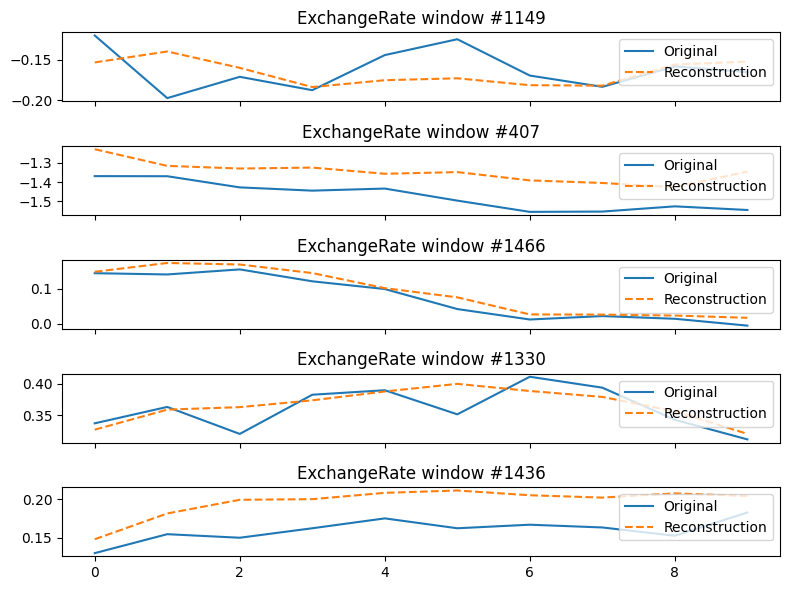


Training AE on Treasury (window_size=10)
  Epoch 1/30 — loss: 0.263639
  Epoch 2/30 — loss: 0.095285
  Epoch 3/30 — loss: 0.075402
  Epoch 4/30 — loss: 0.067497
  Epoch 5/30 — loss: 0.053359
  Epoch 6/30 — loss: 0.051302
  Epoch 7/30 — loss: 0.042220
  Epoch 8/30 — loss: 0.045758
  Epoch 9/30 — loss: 0.044950
  Epoch 10/30 — loss: 0.040315
  Epoch 11/30 — loss: 0.040692
  Epoch 12/30 — loss: 0.038507
  Epoch 13/30 — loss: 0.032342
  Epoch 14/30 — loss: 0.033357
  Epoch 15/30 — loss: 0.034949
  Epoch 16/30 — loss: 0.033804
  Epoch 17/30 — loss: 0.034355
  Epoch 18/30 — loss: 0.034776
  Epoch 19/30 — loss: 0.033554
  Epoch 20/30 — loss: 0.032868
  Epoch 21/30 — loss: 0.032717
  Epoch 22/30 — loss: 0.030350
  Epoch 23/30 — loss: 0.035318
  Epoch 24/30 — loss: 0.032896
  Epoch 25/30 — loss: 0.033136
  Epoch 26/30 — loss: 0.030626
  Epoch 27/30 — loss: 0.034738
  Epoch 28/30 — loss: 0.031736
  Epoch 29/30 — loss: 0.027886
  Epoch 30/30 — loss: 0.038392
Saved AE: trained_autoencoders\ae_Tre

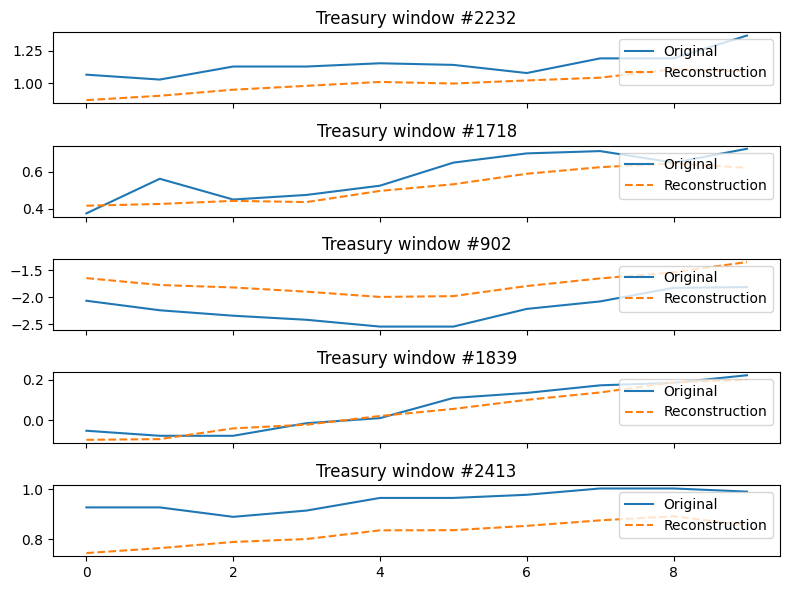


Training AE on WindSpeed (window_size=10)
  Epoch 1/30 — loss: 0.813831
  Epoch 2/30 — loss: 0.591794
  Epoch 3/30 — loss: 0.508560
  Epoch 4/30 — loss: 0.435665
  Epoch 5/30 — loss: 0.376446
  Epoch 6/30 — loss: 0.346757
  Epoch 7/30 — loss: 0.321323
  Epoch 8/30 — loss: 0.295401
  Epoch 9/30 — loss: 0.290153
  Epoch 10/30 — loss: 0.276554
  Epoch 11/30 — loss: 0.262841
  Epoch 12/30 — loss: 0.244462
  Epoch 13/30 — loss: 0.236253
  Epoch 14/30 — loss: 0.228409
  Epoch 15/30 — loss: 0.223516
  Epoch 16/30 — loss: 0.219904
  Epoch 17/30 — loss: 0.202719
  Epoch 18/30 — loss: 0.201897
  Epoch 19/30 — loss: 0.193710
  Epoch 20/30 — loss: 0.188371
  Epoch 21/30 — loss: 0.185650
  Epoch 22/30 — loss: 0.180404
  Epoch 23/30 — loss: 0.179931
  Epoch 24/30 — loss: 0.177060
  Epoch 25/30 — loss: 0.174849
  Epoch 26/30 — loss: 0.170305
  Epoch 27/30 — loss: 0.167724
  Epoch 28/30 — loss: 0.163830
  Epoch 29/30 — loss: 0.163317
  Epoch 30/30 — loss: 0.157201
Saved AE: trained_autoencoders\ae_Wi

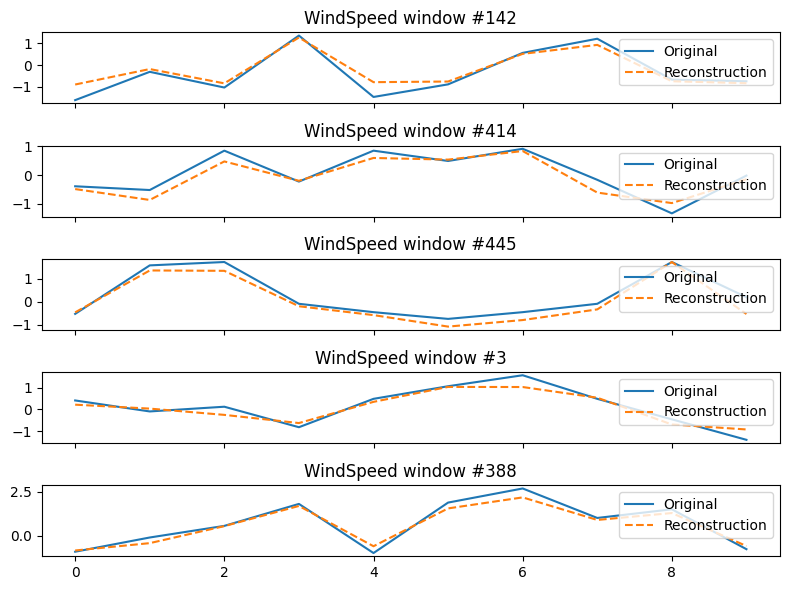


Training AE on Air Quality (window_size=10)
  Epoch 1/30 — loss: 0.322659
  Epoch 2/30 — loss: 0.176795
  Epoch 3/30 — loss: 0.117316
  Epoch 4/30 — loss: 0.126508
  Epoch 5/30 — loss: 0.128243
  Epoch 6/30 — loss: 0.108657
  Epoch 7/30 — loss: 0.112358
  Epoch 8/30 — loss: 0.101491
  Epoch 9/30 — loss: 0.089216
  Epoch 10/30 — loss: 0.102375
  Epoch 11/30 — loss: 0.084157
  Epoch 12/30 — loss: 0.076323
  Epoch 13/30 — loss: 0.087559
  Epoch 14/30 — loss: 0.087688
  Epoch 15/30 — loss: 0.073534
  Epoch 16/30 — loss: 0.059107
  Epoch 17/30 — loss: 0.056947
  Epoch 18/30 — loss: 0.059150
  Epoch 19/30 — loss: 0.059186
  Epoch 20/30 — loss: 0.048144
  Epoch 21/30 — loss: 0.053007
  Epoch 22/30 — loss: 0.048347
  Epoch 23/30 — loss: 0.048195
  Epoch 24/30 — loss: 0.045617
  Epoch 25/30 — loss: 0.044361
  Epoch 26/30 — loss: 0.047787
  Epoch 27/30 — loss: 0.045623
  Epoch 28/30 — loss: 0.045007
  Epoch 29/30 — loss: 0.042252
  Epoch 30/30 — loss: 0.043557
Saved AE: trained_autoencoders\ae_

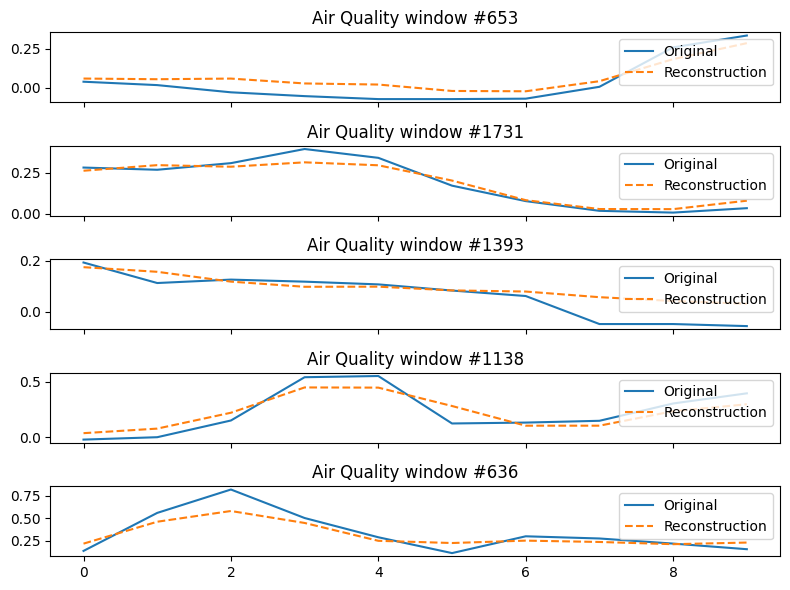

In [4]:
# Autoencoder Training Settings
epochs    = 30
lr        = 1e-3
dropout_p = 0.3

# Ensure a clean autoencoders/ directory
if os.path.exists(AE_DIR):
    shutil.rmtree(AE_DIR)
os.makedirs(AE_DIR, exist_ok=True)

for ds_name, DS, length, window_size in ts_configs:
    print(f"\nTraining AE on {ds_name} (window_size={window_size})")
    # Load data
    ts = DS(length=length)
    X_train, y_train, X_val, y_val, X_test, y_test = windowing(ts.data, window_size)
    
    
    # model + optimizer + loss
    ae        = ConvAutoencoder1D(window_size, latent_dim, dropout_p).to(device)
    optimizer = torch.optim.Adam(ae.parameters(), lr=lr)
    criterion = nn.MSELoss()
    
    # wrap as DataLoader of shape (batch, 1, window_size)
    ds_loader = DataLoader(
        TensorDataset(torch.tensor(X_train, dtype=torch.float).unsqueeze(1)),
        batch_size=128, 
        shuffle=True, 
        generator= g
    )
    
    # training loop
    for epoch in range(1, epochs + 1):
        losses = []
        ae.train()
        for (batch_x,) in ds_loader:
            batch_x = batch_x.to(device)
            recon   = ae(batch_x)
            loss    = criterion(recon, batch_x)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            losses.append(loss.item())
        print(f"  Epoch {epoch}/{epochs} — loss: {np.mean(losses):.6f}")
    
    # save per‐dataset autoencoder
    ckpt_path = os.path.join(AE_DIR, f"ae_{ds_name}.pth")
    torch.save(ae.state_dict(), ckpt_path)
    print(f"Saved AE: {ckpt_path}")

    # 6. Visualize reconstructions in eval mode
    ae.eval()
    sample_idxs = random.sample(range(len(X_val)), 5)
    fig, axes = plt.subplots(5, 1, figsize=(8, 6), sharex=True)
    for ax, idx in zip(axes, sample_idxs):
        orig = X_train[idx]
        with torch.no_grad():
            inp = torch.tensor(orig, dtype=torch.float).unsqueeze(0).unsqueeze(0).to(device)
            recon = ae(inp).cpu().squeeze().numpy()
        ax.plot(orig, label="Original")
        ax.plot(recon, linestyle="--", label="Reconstruction")
        ax.set_title(f"{ds_name} window #{idx}")
        ax.legend(loc="upper right")
    plt.tight_layout()
    plt.show()

### Forecaster Training

For each dataset, a collection of classical and neural network-based forecasters are trained on the training split. Each trained model is saved as a serialized `.pkl` file for future evaluation and selection.

In [5]:
# Ensure a clean forecasters/ directory
if os.path.exists(FORECASTERS_DIR):
    shutil.rmtree(FORECASTERS_DIR)
os.makedirs(FORECASTERS_DIR, exist_ok=True)

for ds_name, DS, length, window_size in ts_configs:
    print(f"\n→ Dataset: {ds_name} (window_size={window_size})")

    # Load data
    ts = DS(length=length)
    X_train, y_train, X_val, y_val, X_test, y_test = windowing(ts.data, window_size)

    forecasters = {
    "ARIMA": ARIMAForecaster(),
    "ExpSmoothing": ExpSmoothingForecaster(trend="add"),
    "LinearRegression": LinearRegressionForecaster(),
    "RandomForest": RandomForestForecaster(n_estimators= 50, max_depth=3, random_state=seed),
    "SVR": SVRForecaster(kernel='rbf', C=1.0, epsilon=0.05),
    "GradientBoosting": GradientBoostingForecaster(n_estimators=50, max_depth=2, random_state=seed),
    "DT": DecisionTreeForecaster(max_depth=3, min_samples_split=4, random_state=seed),
    "MLP1": MLPForecaster(hidden_layer_sizes=(64,), random_state=seed),
    "MLP2": MLPForecaster(hidden_layer_sizes=(64, 32), random_state=seed),
    "MLP3": MLPForecaster(hidden_layer_sizes=(128, 64, 32), random_state=seed),
    "LSTM1": LSTMForecaster(hidden_size=32,
                            num_layers=1,
                            dropout=0.0,
                            lr=1e-3,
                            epochs=30,
                            batch_size=64
                            ),
    "LSTM2": LSTMForecaster(hidden_size=64,
                            num_layers=2,
                            dropout=0.2,
                            lr=1e-3,
                            epochs=40,
                            batch_size=64
            ),
    "LSTM3": LSTMForecaster(hidden_size=128,
                            num_layers=3,
                            dropout=0.3,
                            lr=5e-4,
                            epochs=50,
                            batch_size=64
            ),
    "BiLSTM1": BiLSTMForecaster(hidden_size=32,
                                num_layers=1,
                                dropout=0.0,
                                lr=1e-3,
                                epochs=30,
                                batch_size=64
            ),
    "BiLSTM2": BiLSTMForecaster(hidden_size=64,
                                num_layers=2,
                                dropout=0.2,
                                lr=1e-3,
                                epochs=40,
                                batch_size=64
            ),
    "BiLSTM3": BiLSTMForecaster(hidden_size=128,
                                num_layers=3,
                                dropout=0.3,
                                lr=5e-4,
                                epochs=50,
                                batch_size=64
            ),
    "CNNLSTM1": CNNLSTMForecaster(conv_channels=(16,),
                                kernel_size=3,
                                lstm_hidden_size=32,
                                lstm_num_layers=1,
                                dropout=0.1,
                                lr=1e-3,
                                epochs=30,
                                batch_size=64
            ),
    "CNNLSTM2": CNNLSTMForecaster(conv_channels=(32, 64),
                                kernel_size=3,
                                lstm_hidden_size=64,
                                lstm_num_layers=2,
                                dropout=0.2,
                                lr=1e-3,
                                epochs=40,
                                batch_size=64
            ),
    "CNNLSTM3": CNNLSTMForecaster(conv_channels=(32, 64, 64),
                                kernel_size=3,
                                lstm_hidden_size=128,
                                lstm_num_layers=3,
                                dropout=0.3,
                                lr=5e-4,
                                epochs=50,
                                batch_size=64
            ),
    }

    for name, model in forecasters.items():
        print(f"    → Training {name}…", end=" ")
        model.fit(X_train, y_train, generator=g)

        # save the entire model object as a .pkl
        save_path = os.path.join(FORECASTERS_DIR, f"{ds_name}_{name}.pkl")
        with open(save_path, "wb") as f:
            pickle.dump(model, f)
        print(f"DONE")


→ Dataset: Temperatures (window_size=10)
    → Training ARIMA… DONE
    → Training ExpSmoothing… DONE
    → Training LinearRegression… DONE
    → Training RandomForest… DONE
    → Training SVR… DONE
    → Training GradientBoosting… DONE
    → Training DT… DONE
    → Training MLP1… DONE
    → Training MLP2… DONE
    → Training MLP3… DONE
    → Training LSTM1… 1/30 0.90883 | 15/30 0.35050 | 30/30 0.34026 | DONE
    → Training LSTM2… 1/40 0.76622 | 15/40 0.34680 | 30/40 0.34236 | 40/40 0.33932 | DONE
    → Training LSTM3… 1/50 0.80246 | 15/50 0.36341 | 30/50 0.34697 | 45/50 0.34397 | 50/50 0.34256 | DONE
    → Training BiLSTM1… 1/30 0.91725 | 15/30 0.35225 | 30/30 0.34781 | DONE
    → Training BiLSTM2… 1/40 0.68012 | 15/40 0.34873 | 30/40 0.34309 | 40/40 0.33935 | DONE
    → Training BiLSTM3… 1/50 0.74242 | 15/50 0.35079 | 30/50 0.34894 | 45/50 0.34784 | 50/50 0.33953 | DONE
    → Training CNNLSTM1… 1/30 0.72171 | 15/30 0.35318 | 30/30 0.34309 | DONE
    → Training CNNLSTM2… 1/40 0.63897

### Model Loading

Pretrained autoencoders and forecasters are loaded from disk for each dataset. These models are stored in a dictionary for subsequent evaluation and model selection steps.

In [6]:
os.makedirs(AE_DIR, exist_ok=True)
os.makedirs(FORECASTERS_DIR, exist_ok=True)

loaded = {}
for ds_name, DS, length, window_size in ts_configs:
    print(f"\n→ Loading models for {ds_name} (window_size={window_size})")
    
    # Load Autoencoder
    ae = ConvAutoencoder1D(window_size, latent_dim, dropout_p).eval().to(device)
    ae_ckpt = os.path.join(AE_DIR, f"ae_{ds_name}.pth")
    ae.load_state_dict(torch.load(ae_ckpt, map_location=device))
    print(f"     AE loaded from {AE_DIR}{os.sep}")
    
    # Load Forecasters
    forecasters = {}
    for name in [
        "ARIMA",
        "ExpSmoothing",
        "LinearRegression",
        "RandomForest",
        "SVR",
        "GradientBoosting",
        "DT",
        "MLP1",
        "MLP2",
        "MLP3",
        "LSTM1",
        "LSTM2",
        "LSTM3",
        "BiLSTM1",
        "BiLSTM2",
        "BiLSTM3",
        "CNNLSTM1",
        "CNNLSTM2",
        "CNNLSTM3",
    ]:
        pkl_path = os.path.join(FORECASTERS_DIR, f"{ds_name}_{name}.pkl")
        with open(pkl_path, "rb") as f:
            forecasters[name] = pickle.load(f)
    print(f"     Forecasters loaded from {FORECASTERS_DIR}{os.sep}")
    
    # Store for later
    loaded[ds_name] = {
        "ae": ae,
        "forecasters": forecasters
    }


→ Loading models for Temperatures (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading models for Births (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading models for SolarPower (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading models for WindPower (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading models for ExchangeRate (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading models for Treasury (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading models for WindSpeed (window_size=10)
     AE loaded from trained_autoencoders\
     Forecasters loaded from trained_forecasters\

→ Loading

### Validation Phase: Region of Competence Construction

Each validation window is used to evaluate all forecasters. The model with the lowest prediction error receives the window as part of its Region of Competence (RoC), stored in both raw and latent representations.


In [7]:
for ds_name, DS, length, window_size in ts_configs:
    print(f"\n=== Validation RoC for {ds_name} (window_size={window_size}) ===")
    
    # Load data
    ts = DS(length=length)
    X_train, y_train, X_val, y_val, X_test, y_test = windowing(ts.data, window_size)

    # Load models
    ae          = loaded[ds_name]["ae"]
    forecasters = loaded[ds_name]["forecasters"]

    # Clear both RoCs
    for model in forecasters.values():
        model.rocs["raw"].clear()
        model.rocs["latent"].clear()

    # Iterate once over validation windows
    for idx, window in enumerate(X_val):
        # a) Pick winner based on raw input
        errors = {}
        for name, model in forecasters.items():
            y_pred = model.predict(window)
            errors[name] = mean_squared_error([y_val[idx]], [y_pred])
        winner = min(errors, key=errors.get)

        # b) Store both raw and latent versions
        raw_vec = window
        with torch.no_grad():
            latent_vec = ae.encode(window).cpu()

        forecasters[winner].rocs["raw"].append(raw_vec)
        forecasters[winner].rocs["latent"].append(latent_vec)

    # Report results
    print("RoC sizes")
    for name, model in forecasters.items():
        count = len(model.rocs["raw"])
        print(f"  {name:<18} {count:4d} entries")


=== Validation RoC for Temperatures (window_size=10) ===
RoC sizes
  ARIMA                87 entries
  ExpSmoothing        159 entries
  LinearRegression     19 entries
  RandomForest         65 entries
  SVR                  66 entries
  GradientBoosting     28 entries
  DT                  122 entries
  MLP1                 41 entries
  MLP2                 40 entries
  MLP3                 25 entries
  LSTM1                17 entries
  LSTM2                12 entries
  LSTM3                28 entries
  BiLSTM1              17 entries
  BiLSTM2              60 entries
  BiLSTM3               8 entries
  CNNLSTM1             19 entries
  CNNLSTM2             39 entries
  CNNLSTM3             50 entries

=== Validation RoC for Births (window_size=10) ===
RoC sizes
  ARIMA                40 entries
  ExpSmoothing         31 entries
  LinearRegression    120 entries
  RandomForest        138 entries
  SVR                  81 entries
  GradientBoosting    116 entries
  DT                

### RoC Clustering

K-means clustering is applied to each model’s latent and raw Regions of Competence (RoC). The optimal number of clusters is estimated, and cluster centers are decoded for visualization. These centers will be used for Cluster-Based model selection.

> Clustering method: All windows are flattened and stacked into a 2D array to serve as input to K-Means algorithm. Then for each value $k$ $\in$ [2, $k_{max}$] we fit a K-Means model, recording the associated inertia (within-cluster sum of squares). The "elbow point" in the inertia curve is identified using the KneeLocator algorithm, selecting the number of clusters that yields the best balance between model complexity and fit quality. The final K-Means clustering is performed with the selected number of clusters, and the resulting cluster centers are reshaped to match the original window shape and type.

Bottleneck size: 2

=== Compute K-means centers for Temperatures (window_size=10) ===


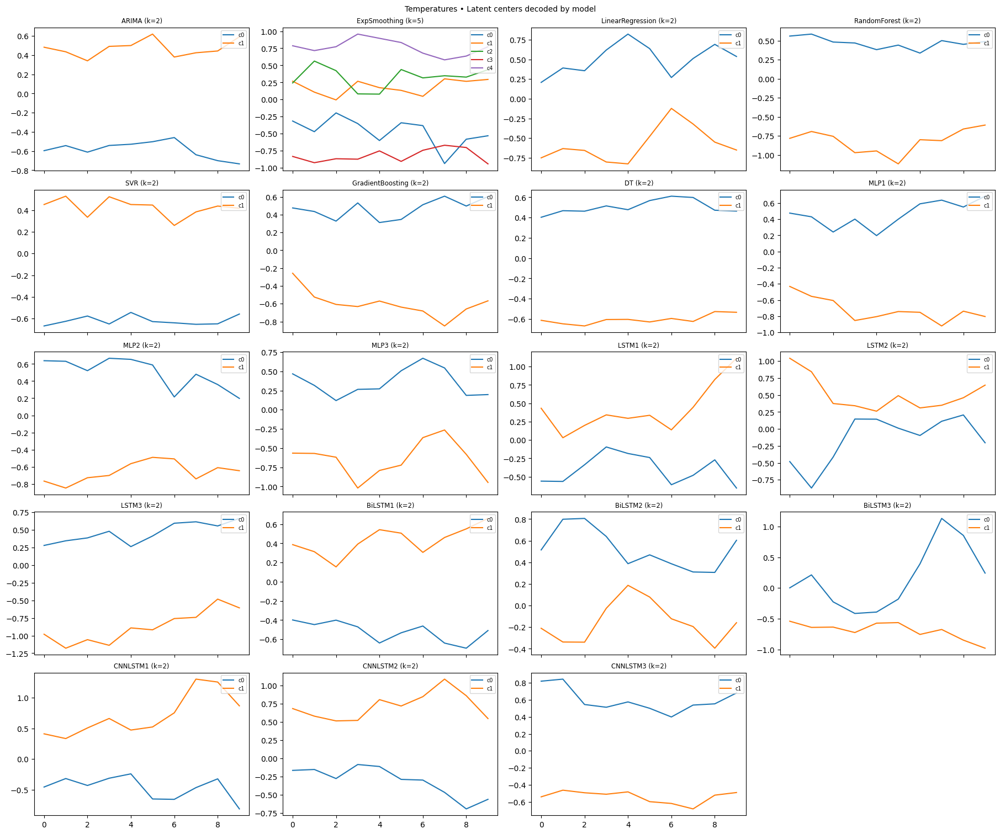


=== Compute K-means centers for Births (window_size=10) ===


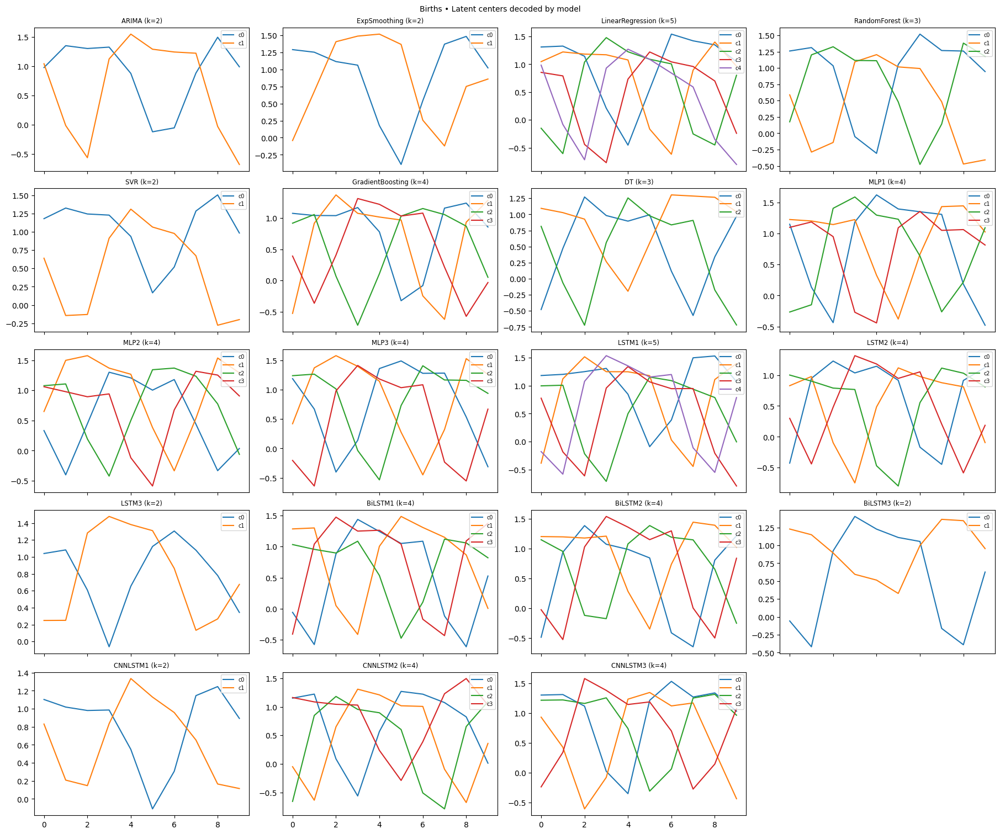


=== Compute K-means centers for SolarPower (window_size=10) ===


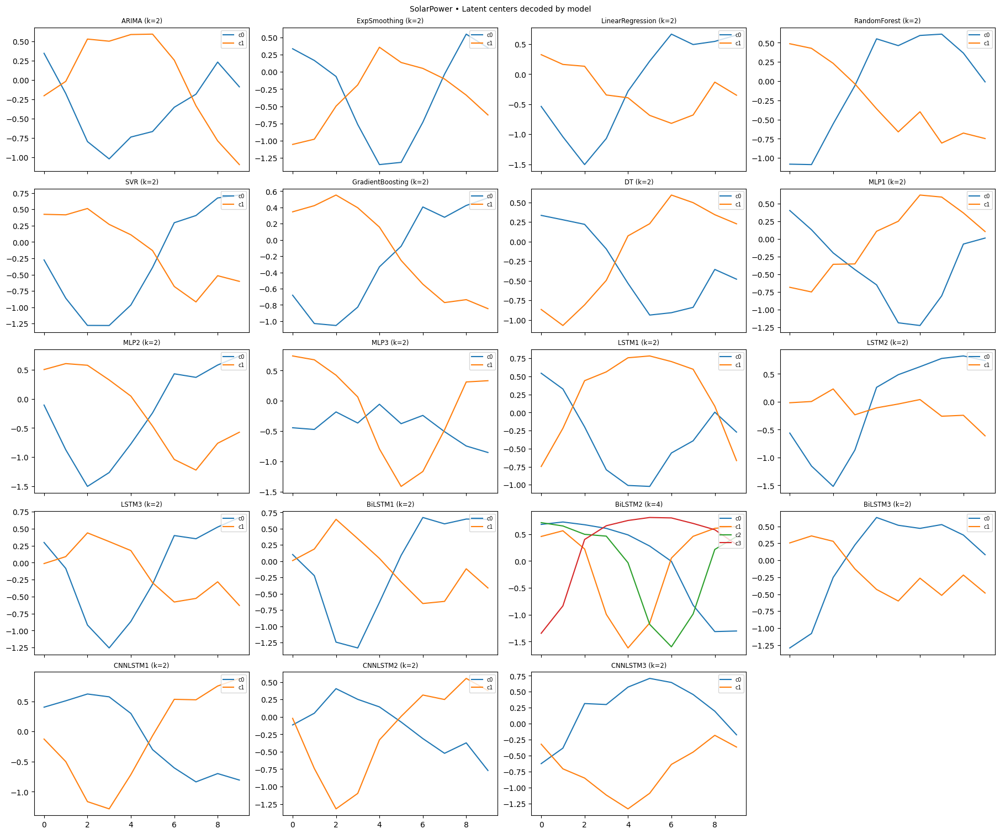


=== Compute K-means centers for WindPower (window_size=10) ===


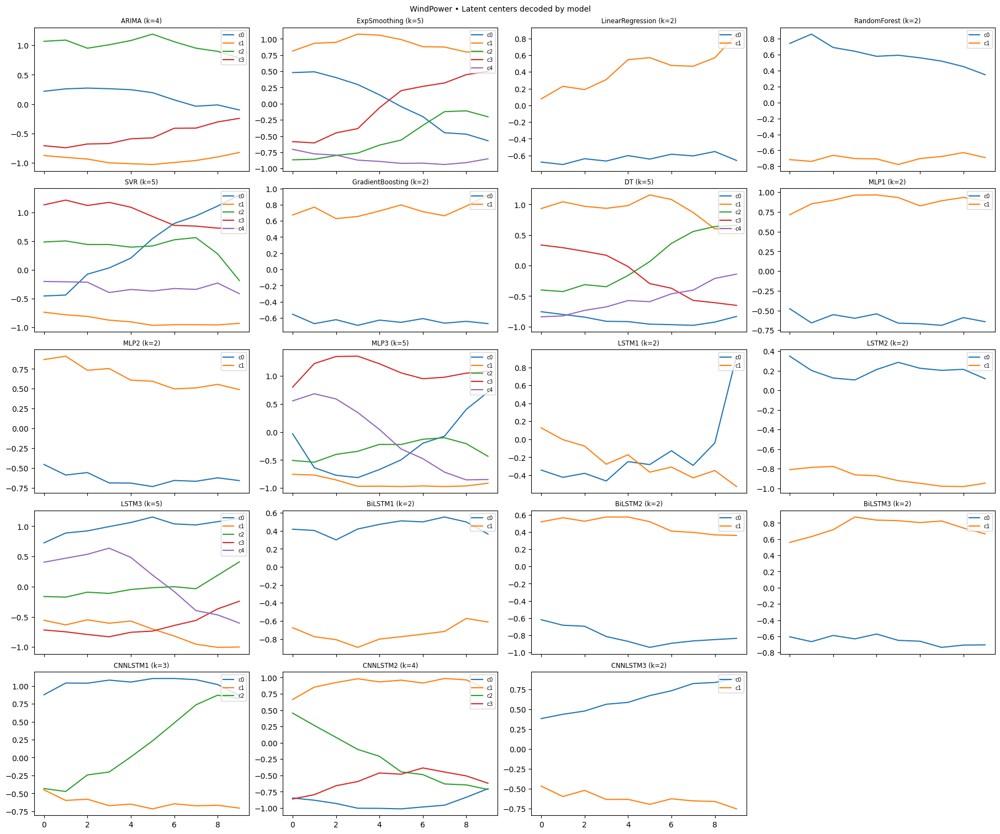


=== Compute K-means centers for ExchangeRate (window_size=10) ===


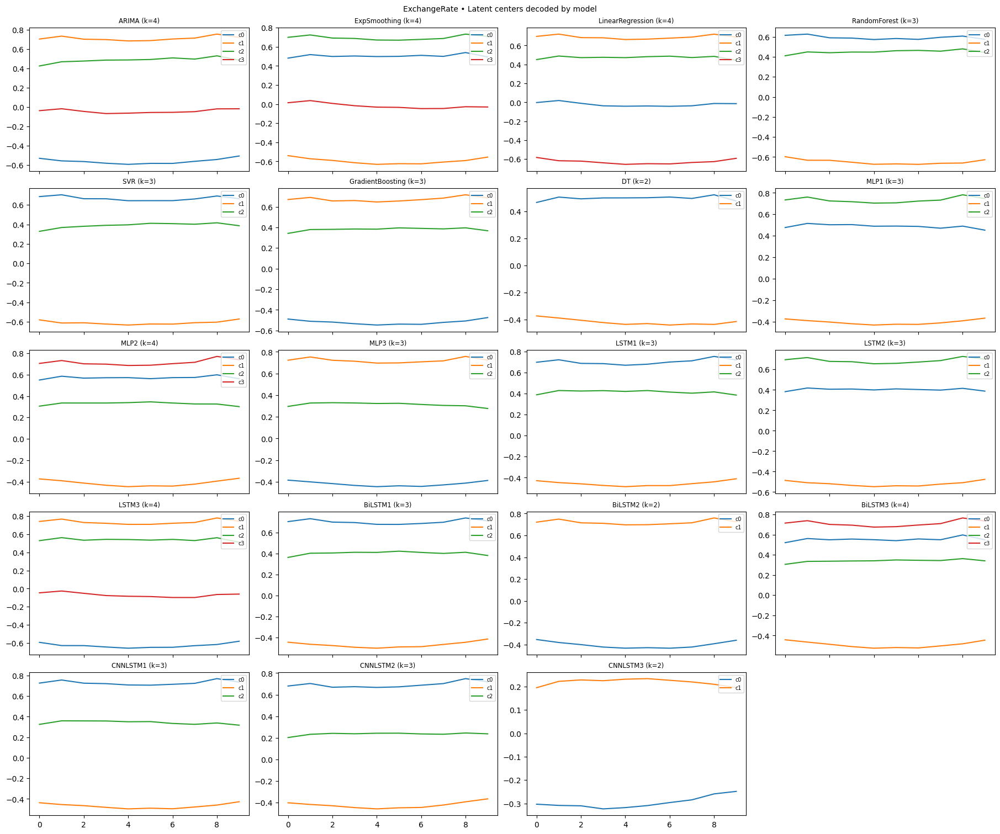


=== Compute K-means centers for Treasury (window_size=10) ===


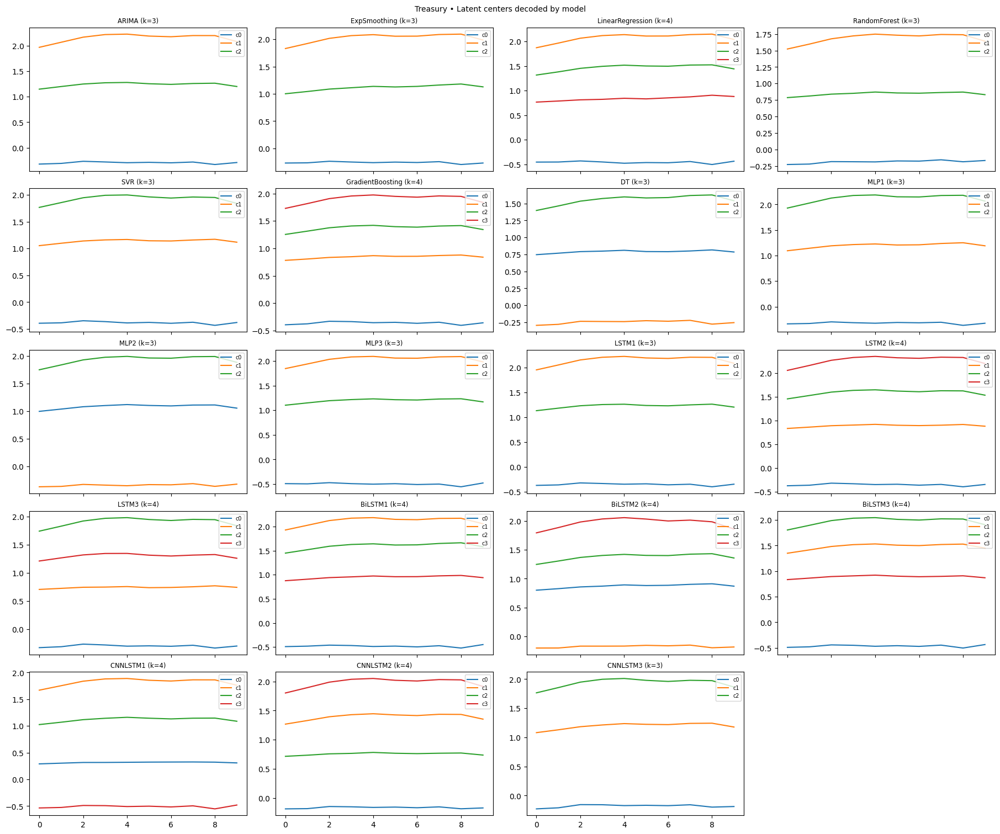


=== Compute K-means centers for WindSpeed (window_size=10) ===


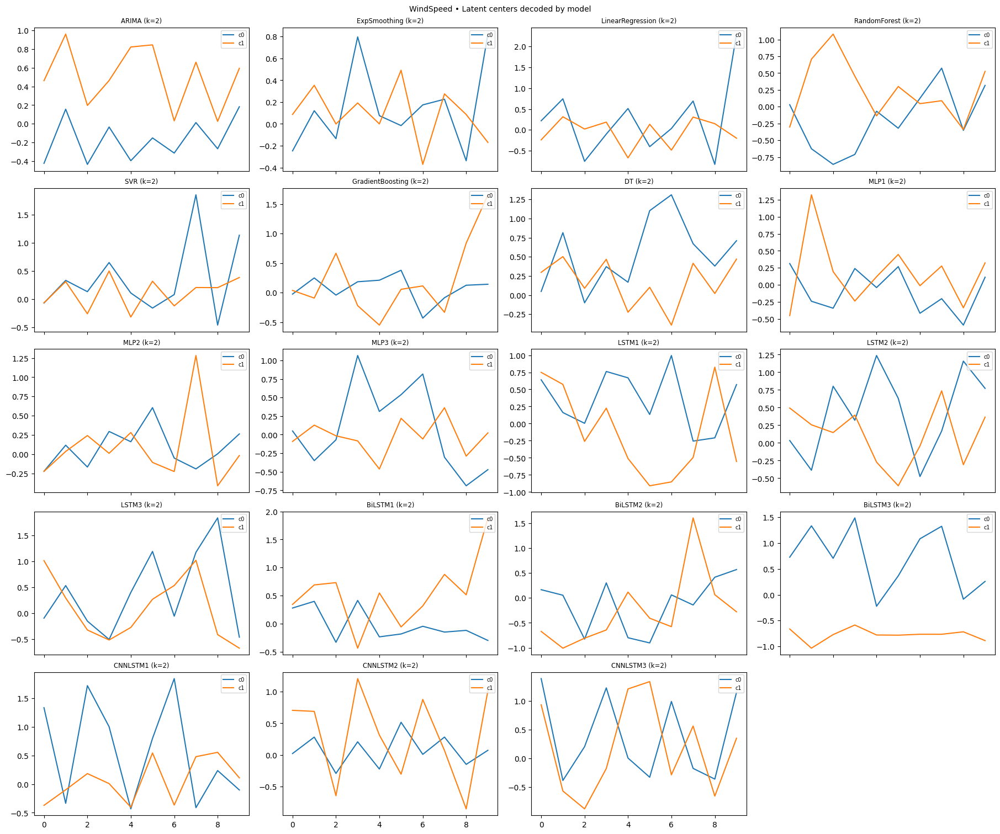


=== Compute K-means centers for Air Quality (window_size=10) ===


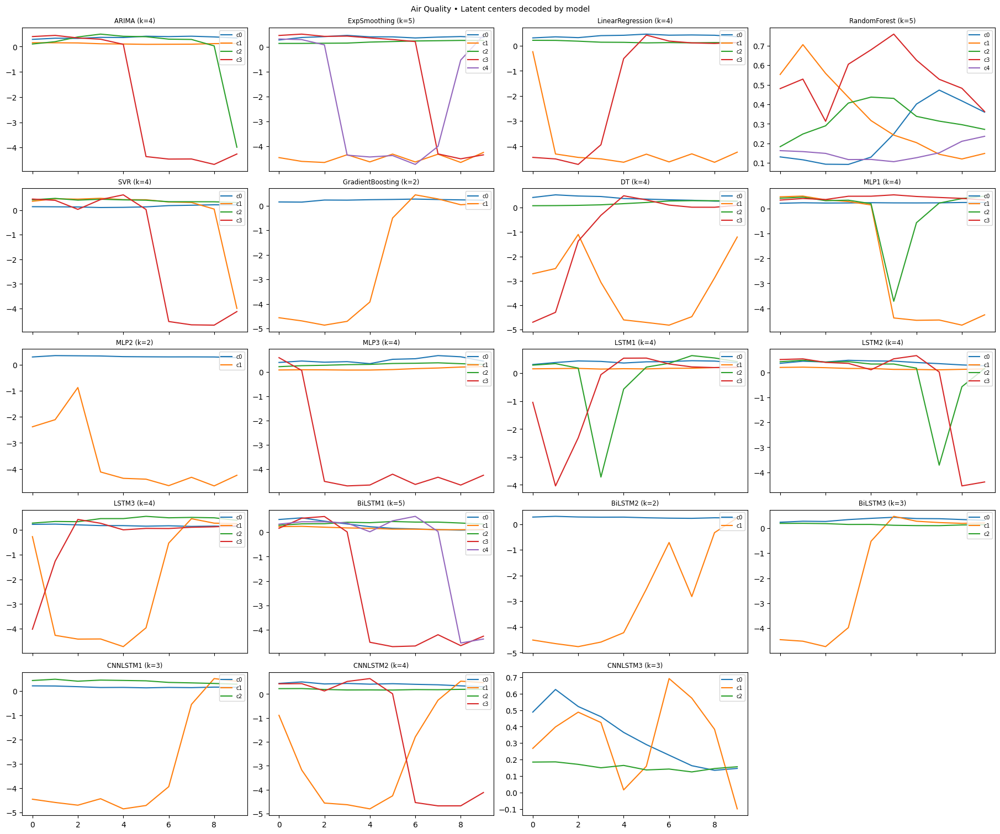

In [8]:
n_cols = 4
print(f"Bottleneck size: {latent_dim}")
for ds_name, DS, length, window_size in ts_configs:
    print(f"\n=== Compute K-means centers for {ds_name} (window_size={window_size}) ===")

    # Load models
    ae = loaded[ds_name]["ae"]
    forecasters = loaded[ds_name]["forecasters"]

    # Clear previous centers
    for model in forecasters.values():
        model.centers = {"raw": [], "latent": []}

    # Determine device for decoding latent centers
    decoder_device = next(ae.decoder.parameters()).device

    for name, model in forecasters.items():
        # Cluster latent RoCs
        N_latent = len(model.rocs["latent"])
        if N_latent > 0:
            k_max_latent = np.sqrt(N_latent / 2)
            model.compute_kmeans_centers(mode="latent", k_max=k_max_latent, random_state=seed)

        # Cluster raw RoCs
        N_raw = len(model.rocs["raw"])
        if N_raw > 0:
            k_max_raw = np.sqrt(N_raw / 2)
            model.compute_kmeans_centers(mode="raw", k_max=k_max_raw, random_state=seed)

    # Plot all latent cluster centers (decoded)
    names = [n for n in forecasters if len(forecasters[n].centers["latent"]) > 0]
    n_models = len(names)
    if n_models == 0:
        print(" No models have centers to plot.")
        continue

    n_rows = math.ceil(n_models / n_cols)

    fig_width = n_cols * 4.5
    fig_height = n_rows * 3

    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(fig_width, fig_height),
                             sharex=True, constrained_layout=True)
    axes = axes.flatten()

    for ax, name in zip(axes, names):
        model = forecasters[name]
        for idx, c in enumerate(model.centers["latent"]):
            # ensure tensor on correct device
            c_tensor = c if isinstance(c, torch.Tensor) else torch.tensor(
                c, dtype=torch.float32
            )
            c_batch = c_tensor.unsqueeze(0).to(decoder_device)  # shape (1, C, L)
            decoded = ae.decoder(c_batch)                       # -> (1, 1, window_size)
            ts_data = decoded.detach().cpu().numpy().flatten()
            ax.plot(ts_data, label=f"c{idx}")
        ax.set_title(f"{name} (k={len(model.centers['latent'])})", fontsize="small")
        ax.legend(loc="upper right", fontsize="x-small")

    # turn off any unused subplots
    for ax in axes[n_models:]:
        ax.axis("off")

    plt.suptitle(f"{ds_name} • Latent centers decoded by model", fontsize="medium")
    plt.show()


### Latent Cluster Sampling

For each model, one latent cluster is selected. All windows assigned to that cluster are decoded and plotted in gray, with the decoded cluster center shown in black.


=== Plot latent cluster samples for Temperatures (compact grid) ===


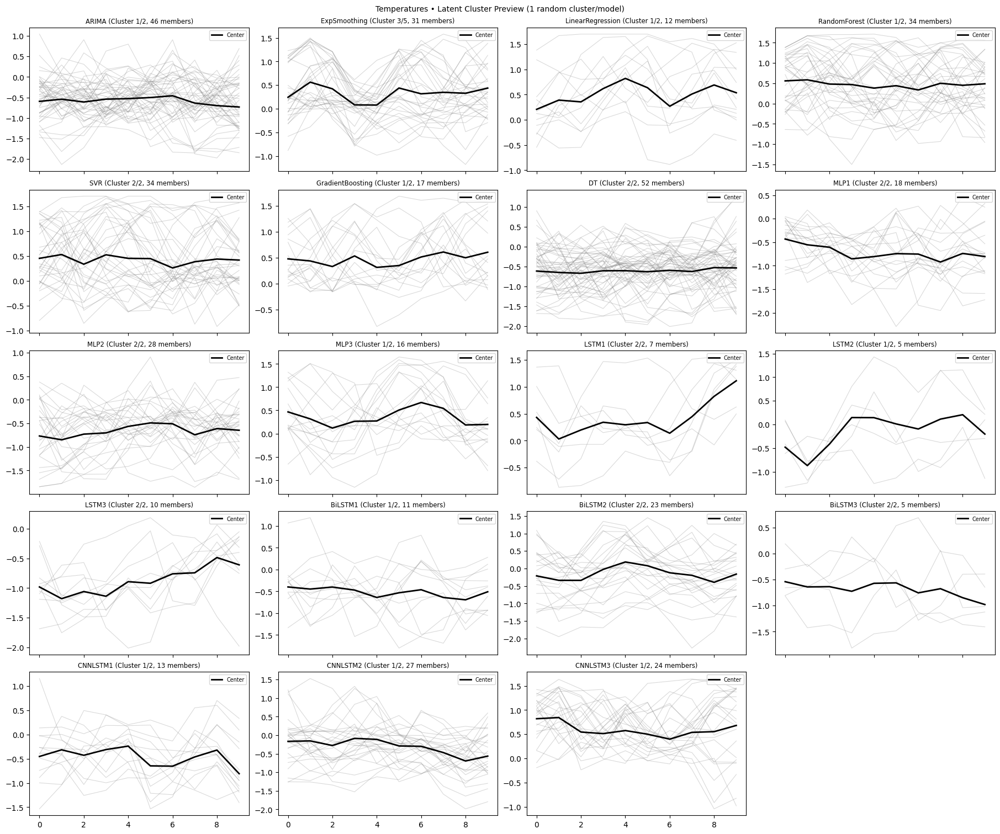


=== Plot latent cluster samples for Births (compact grid) ===


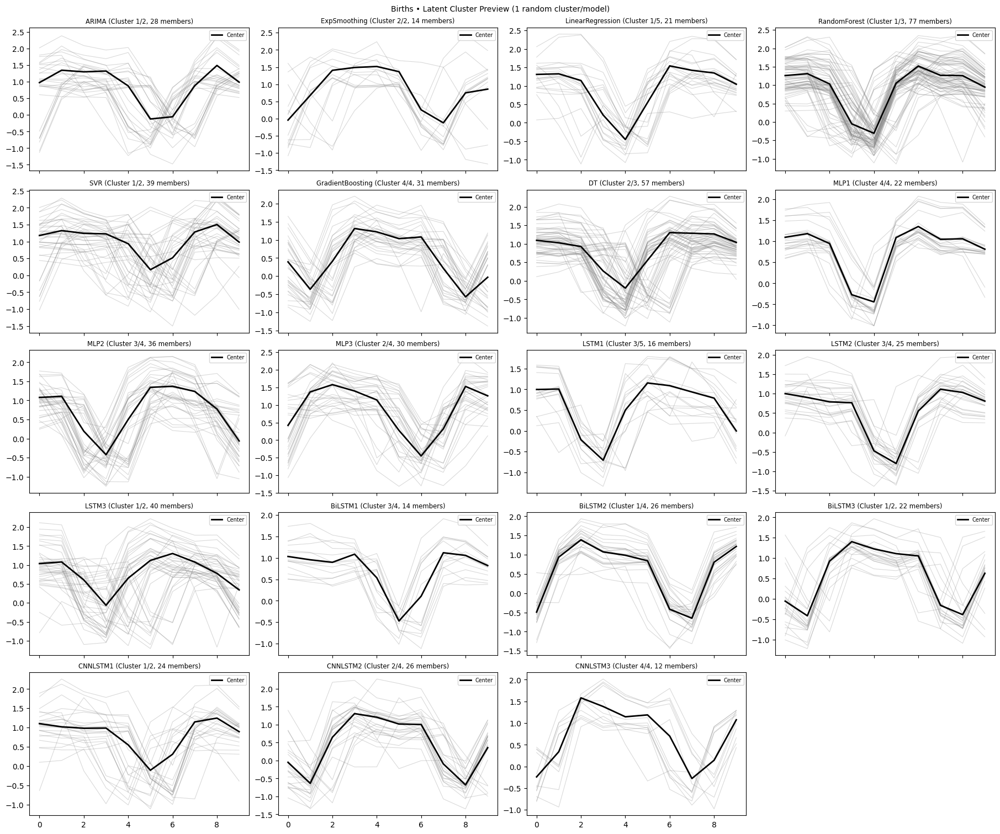


=== Plot latent cluster samples for SolarPower (compact grid) ===


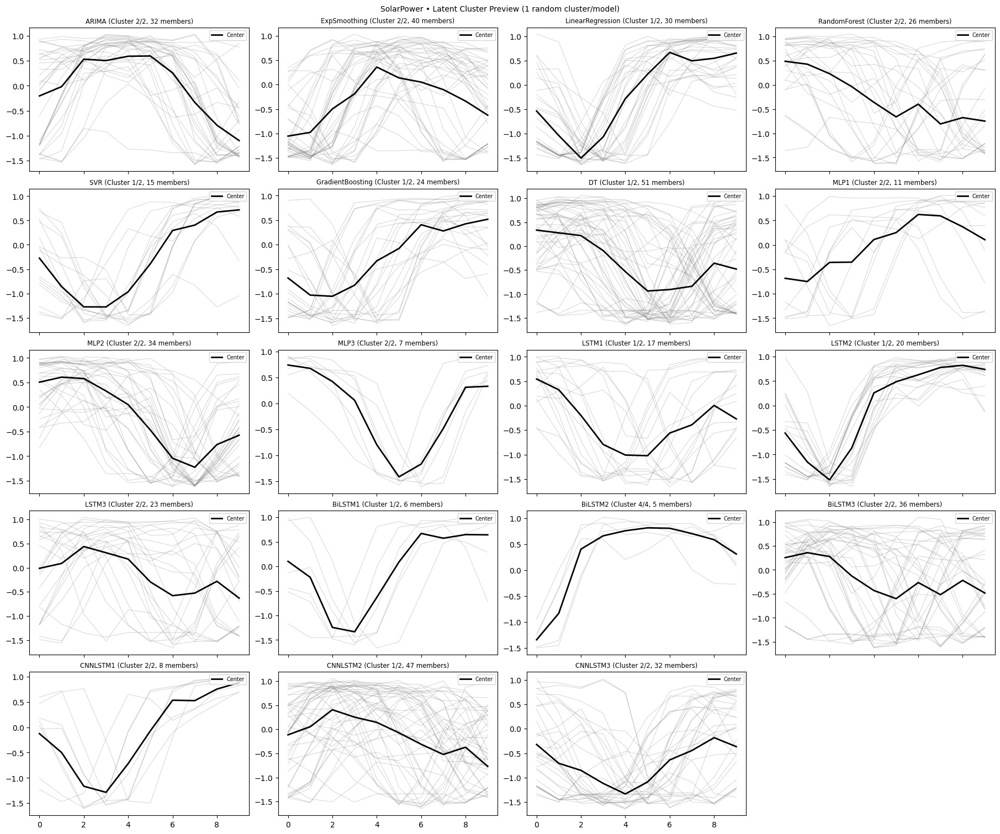


=== Plot latent cluster samples for WindPower (compact grid) ===


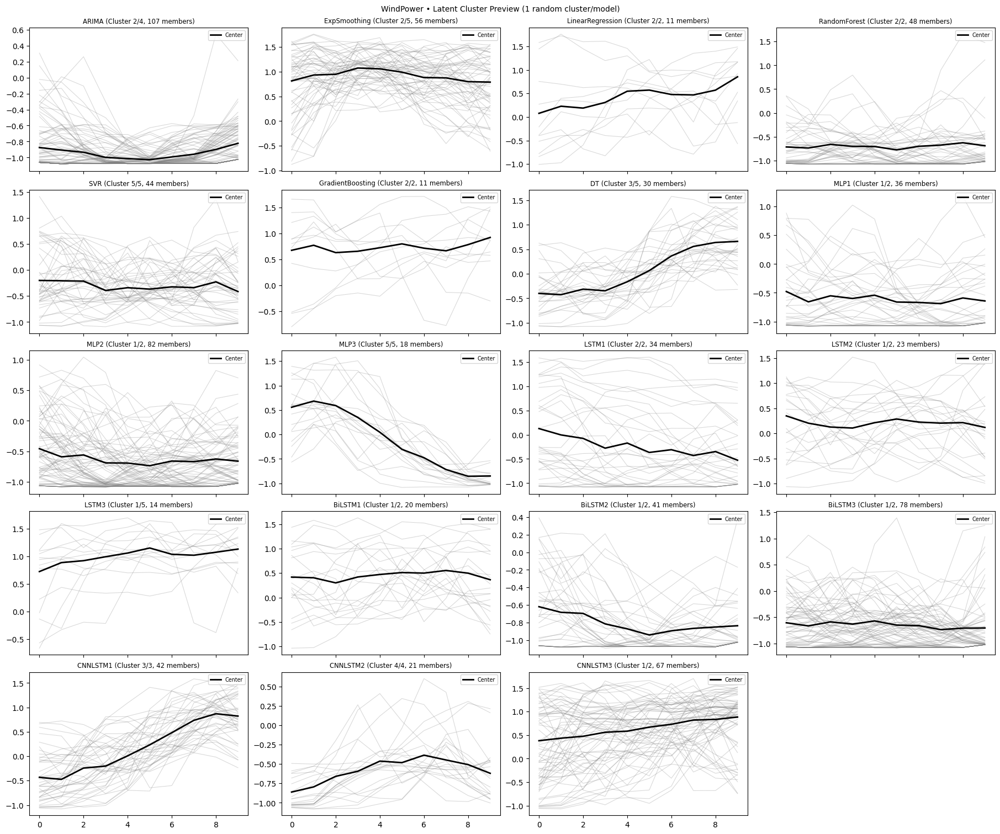


=== Plot latent cluster samples for ExchangeRate (compact grid) ===


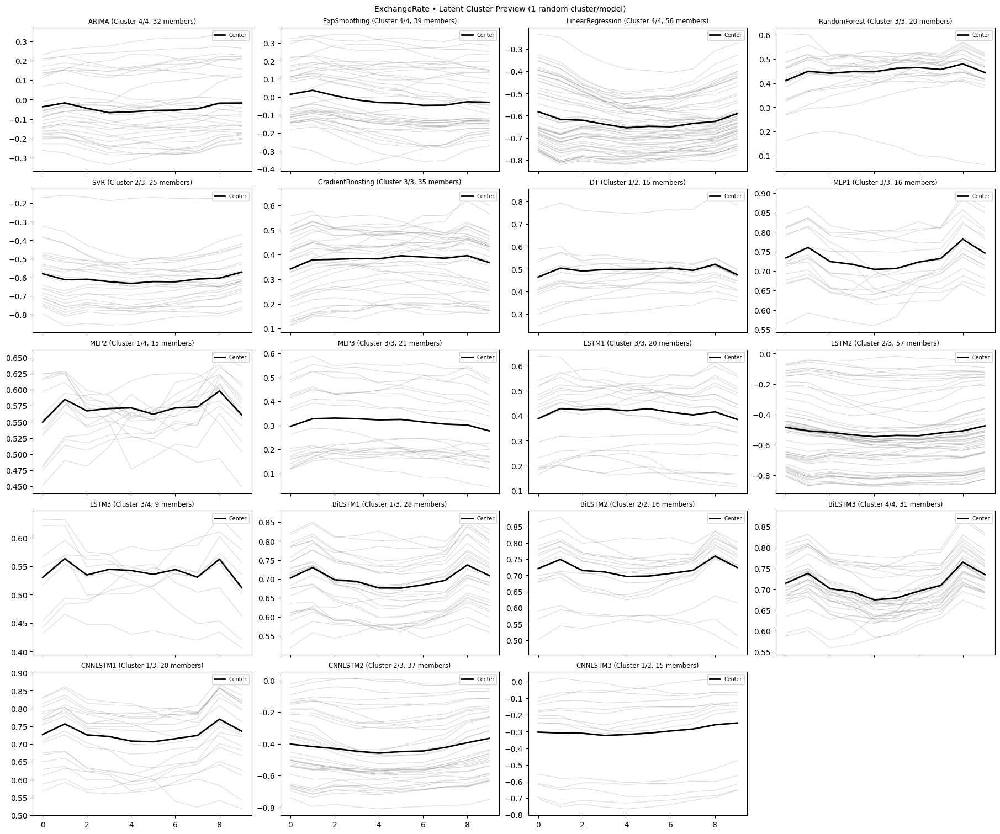


=== Plot latent cluster samples for Treasury (compact grid) ===


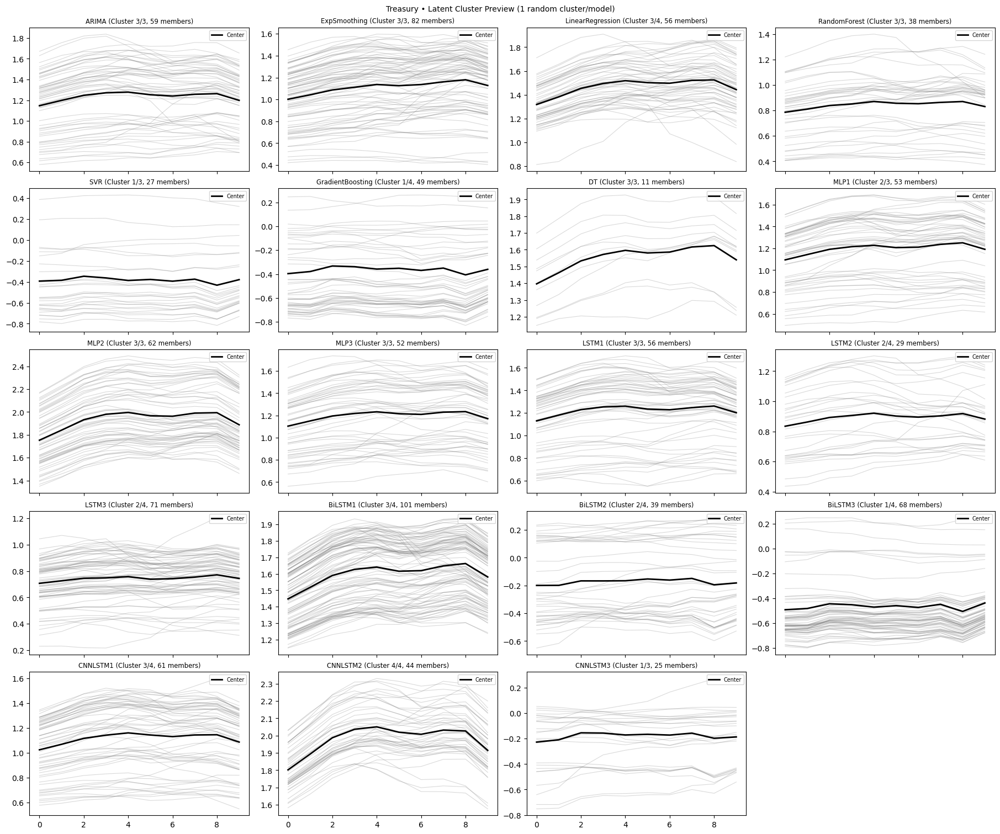


=== Plot latent cluster samples for WindSpeed (compact grid) ===


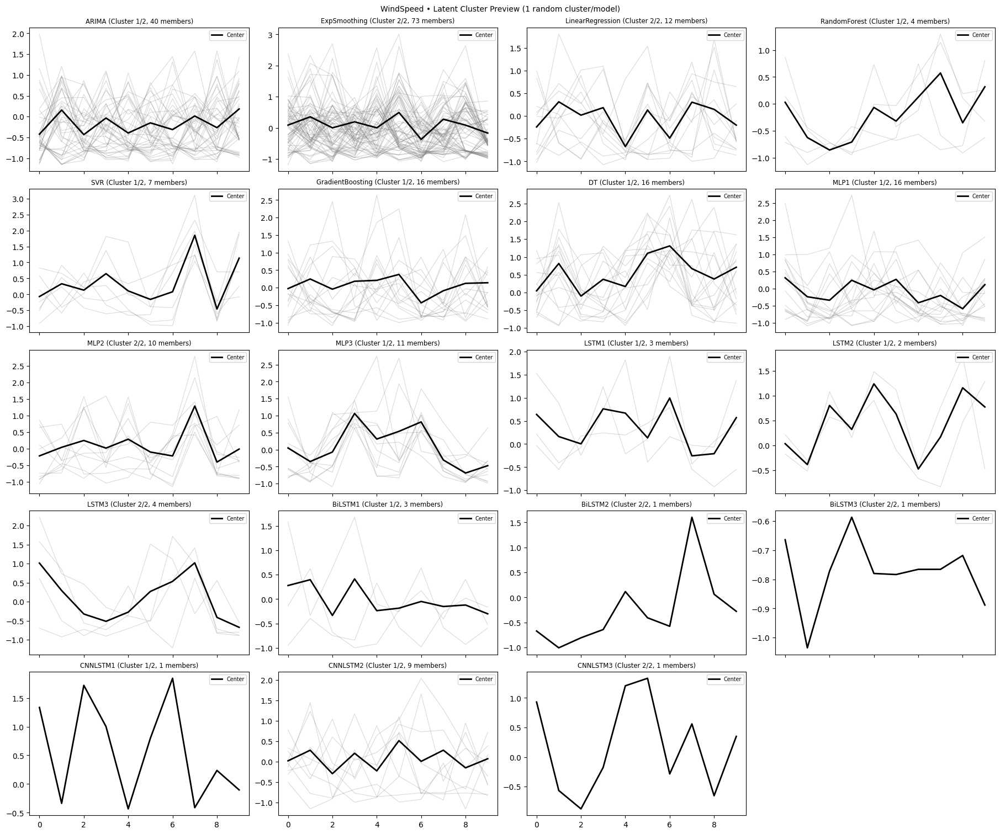


=== Plot latent cluster samples for Air Quality (compact grid) ===


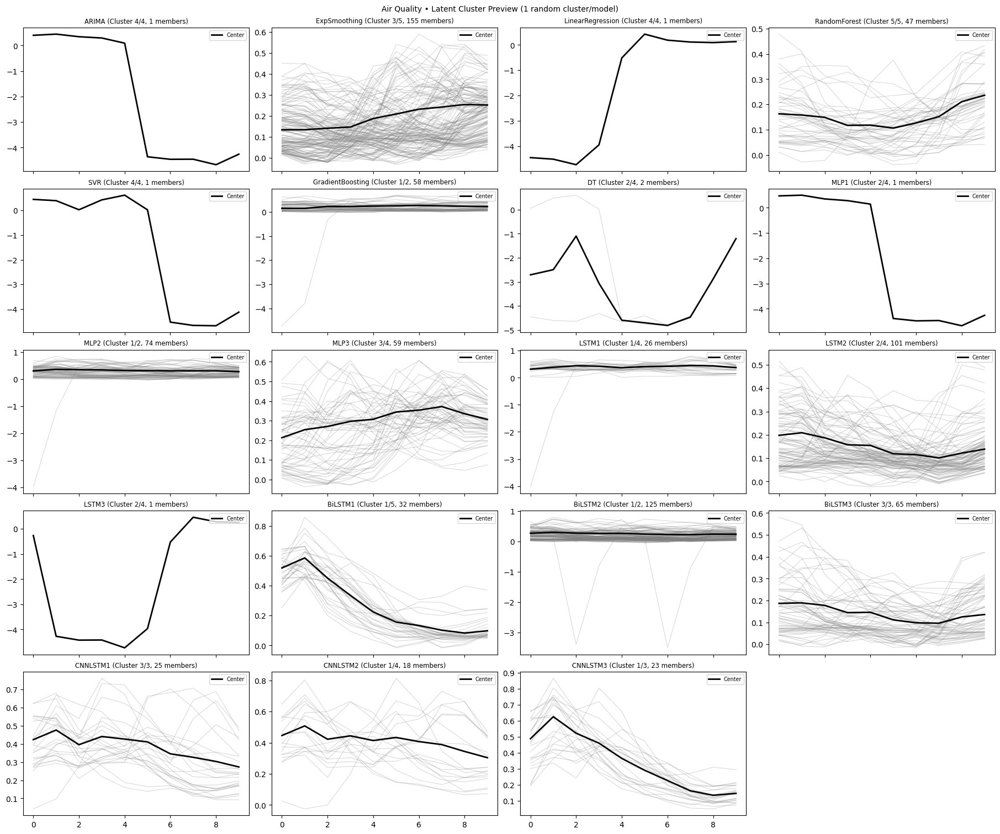

In [9]:
n_cols = 4
for ds_name, DS, length, window_size in ts_configs:
    print(f"\n=== Plot latent cluster samples for {ds_name} (compact grid) ===")

    ae = loaded[ds_name]["ae"]
    forecasters = loaded[ds_name]["forecasters"]
    decoder_device = next(ae.decoder.parameters()).device

    valid_models = []
    for name, model in forecasters.items():
        centers = model.centers["latent"]
        windows = model.rocs["latent"]

        if len(centers) == 0 or len(windows) == 0:
            continue

        # Flatten latent windows
        X = np.vstack([
            (w.detach().cpu().numpy() if isinstance(w, torch.Tensor) else np.array(w)).flatten()
            for w in windows
        ])

        # Flatten latent centers
        C = np.vstack([
            (c.detach().cpu().numpy() if isinstance(c, torch.Tensor) else np.array(c)).flatten()
            for c in centers
        ])

        # Use KMeans.predict with existing centers
        km = KMeans(n_clusters=len(C), init=C, n_init=1, max_iter=1, random_state=seed)
        labels = km.fit_predict(X)

        # Group windows by cluster
        cluster_to_indices = {i: [] for i in range(len(C))}
        for idx, label in enumerate(labels):
            cluster_to_indices[label].append(idx)

        valid_models.append((name, model, centers, cluster_to_indices, windows))

    n_models = len(valid_models)
    if n_models == 0:
        print(" No valid models to plot.")
        continue

    n_rows = math.ceil(n_models / n_cols)

    fig_width = n_cols * 4.5
    fig_height = n_rows * 3

    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(fig_width, fig_height),
                             sharex=True, constrained_layout=True)
    axes = axes.flatten()

    for ax, (name, model, centers, cluster_to_indices, windows) in zip(axes, valid_models):
        non_empty_clusters = [i for i, idxs in cluster_to_indices.items() if len(idxs) > 0]
        if not non_empty_clusters:
            ax.set_title(f"{name} (no populated clusters)", fontsize="small")
            ax.axis("off")
            continue

        chosen_c = random.choice(non_empty_clusters)
        member_indices = cluster_to_indices[chosen_c]

        for i in member_indices:
            w_tensor = windows[i].unsqueeze(0).to(decoder_device)
            decoded = ae.decoder(w_tensor).detach().cpu().numpy().flatten()
            ax.plot(decoded, alpha=0.3, linewidth=0.8, color='gray')

        c_tensor = centers[chosen_c].unsqueeze(0).to(decoder_device)
        decoded_center = ae.decoder(c_tensor).detach().cpu().numpy().flatten()
        ax.plot(decoded_center, color='black', linewidth=2, label="Center")

        ax.set_title(
            f"{name} (Cluster {chosen_c + 1}/{len(centers)}, {len(member_indices)} members)",
            fontsize="small"
        )
        ax.legend(loc="upper right", fontsize="x-small")

    # Turn off unused axes
    for ax in axes[n_models:]:
        ax.axis("off")

    plt.suptitle(f"{ds_name} • Latent Cluster Preview (1 random cluster/model)",
                 fontsize="medium")
    plt.show()

## RQ1: Latent vs. Raw Space for Model Selection Across Distance Metrics

The goal is to compare the effectiveness of model selection based on similarity in latent space via autoencoder embeddings versus raw time-domain. This comparison is conducted across multiple distance measures, including Euclidean, Cosine, Manhattan and Dynamic Time Warping applied in both raw and latent spaces.

### Test 1.1: Forecasting MSE Comparison

We compare one-step-ahead forecasting error (MSE) when selecting forecaster in raw vs. latent space using three distance metrics. For each, lower MSE from latent-space selection indicates that the latent embedding preserves meaningful similarity under the corresponding metric. 

In [10]:
# Lists to collect detailed disagreements, high-level summaries, and neighbor sets
disagreements = []
summary_list = []
neighbor_data = []

# Ensure a clean results/ directory
if os.path.exists(RESULTS_DIR):
    shutil.rmtree(RESULTS_DIR)
os.makedirs(RESULTS_DIR, exist_ok=True)

print(f"Bottleneck size: {latent_dim}")

for ds_name, DS, length, window_size in ts_configs:
    print(f"\n=== Dataset: {ds_name} ===")

    # Load data
    ts = DS(length=length)
    X_train, y_train, X_val, y_val, X_test, y_test = windowing(ts.data, window_size)

    # Load forecasters
    ae = loaded[ds_name]["ae"]
    forecasters = loaded[ds_name]["forecasters"]
    n_windows = len(X_test)

    for metric in metrics_list:
        # prepare neighbor-set collectors
        raw_neighbor_sets = []
        lat_neighbor_sets = []

        # ---- RAW inference ----
        t0 = time.perf_counter()
        raw_preds, raw_models = [], []
        for w in X_test:
            q = w
            best_name, best_dist = None, float("inf")
            window_dists = []
            for name, model in forecasters.items():
                for entry in model.rocs["raw"]:
                    d = compute_distance(q, entry, metric=metric)
                    window_dists.append((d, name))
                    if d < best_dist:
                        best_dist, best_name = d, name
            raw_models.append(best_name)
            window_dists.sort(key=lambda x: x[0])
            raw_neighbor_sets.append([name for _, name in window_dists[:5]])
            raw_preds.append(forecasters[best_name].predict(w))
        time_raw = time.perf_counter() - t0
        mse_raw  = mean_squared_error(y_test, raw_preds)

        # ---- LATENT inference ----
        t1 = time.perf_counter()
        lat_preds, lat_models = [], []
        for w in X_test:
            with torch.no_grad():
                q = ae.encode(w).cpu()
            best_name, best_dist = None, float("inf")
            window_dists = []
            for name, model in forecasters.items():
                for entry in model.rocs["latent"]:
                    d = compute_distance(q, entry, metric=metric)
                    window_dists.append((d, name))
                    if d < best_dist:
                        best_dist, best_name = d, name
            lat_models.append(best_name)
            window_dists.sort(key=lambda x: x[0])
            lat_neighbor_sets.append([name for _, name in window_dists[:5]])
            lat_preds.append(forecasters[best_name].predict(w))
        time_lat = time.perf_counter() - t1
        mse_lat  = mean_squared_error(y_test, lat_preds)

        # ---- Record neighbor‐sets for later Jaccard analysis ----
        for idx in range(n_windows):
            neighbor_data.append({
                "dataset":       ds_name,
                "metric":        metric,
                "win_idx":       idx,
                "raw_neighbors": raw_neighbor_sets[idx],
                "lat_neighbors": lat_neighbor_sets[idx],
            })

        # ---- Record disagreements ----
        n_dis = 0
        for idx, (rm, lm, yt, pr, pl) in enumerate(zip(raw_models, lat_models, y_test, raw_preds, lat_preds)):
            if rm != lm:
                n_dis += 1
                disagreements.append({
                    "dataset":      ds_name,
                    "metric":       metric,
                    "win_idx":      idx,
                    "raw_model":    rm,
                    "lat_model":    lm,
                    "y_true":       yt,
                    "y_pred_raw":   pr,
                    "y_pred_lat":   pl,
                })
        rate = n_dis / n_windows

        # ---- Append summary ----
        summary_list.append({
            "dataset":          ds_name,
            "metric":           metric,
            "test_mse_raw":     mse_raw,
            "test_mse_lat":     mse_lat,
            "time_raw":         time_raw,
            "time_lat":         time_lat,
            "n_disagreements":  n_dis,
            "disagreement_rate":rate,
        })

        # ---- Print results ----
        print(
            f"[{metric:^9}] "
            f"raw MSE={mse_raw:.4f}@{time_raw:.2f}s | "
            f"lat MSE={mse_lat:.4f}@{time_lat:.2f}s | "
            f"dis={n_dis}/{n_windows} ({rate:.2%})  | "
            f"%‐improvement: {1 - mse_lat/mse_raw:.2%}"
        )

# Build DataFrames and save
df_dis = pd.DataFrame(disagreements)
df_sum = pd.DataFrame(summary_list)
df_nei = pd.DataFrame(neighbor_data)

df_dis.to_csv("results/disagreements.csv", index=False)
df_sum.to_csv("results/validation.csv",    index=False)
df_nei.to_csv("results/neighbor_sets.csv", index=False)

Bottleneck size: 2

=== Dataset: Temperatures ===
[   dtw   ] raw MSE=0.3626@34.76s | lat MSE=0.3351@41.91s | dis=741/903 (82.06%)  | %‐improvement: 7.59%
[euclidean] raw MSE=0.3496@4.71s | lat MSE=0.3462@8.86s | dis=585/903 (64.78%)  | %‐improvement: 0.99%
[ cosine  ] raw MSE=0.3497@6.63s | lat MSE=0.3402@18.52s | dis=684/903 (75.75%)  | %‐improvement: 2.71%
[manhattan] raw MSE=0.3570@5.15s | lat MSE=0.3308@9.42s | dis=604/903 (66.89%)  | %‐improvement: 7.34%

=== Dataset: Births ===
[   dtw   ] raw MSE=0.3302@115.74s | lat MSE=0.2772@138.01s | dis=1267/1817 (69.73%)  | %‐improvement: 16.05%
[euclidean] raw MSE=0.2447@10.66s | lat MSE=0.2407@27.02s | dis=1015/1817 (55.86%)  | %‐improvement: 1.64%
[ cosine  ] raw MSE=0.2288@19.75s | lat MSE=0.2346@66.39s | dis=1435/1817 (78.98%)  | %‐improvement: -2.54%
[manhattan] raw MSE=0.2410@13.55s | lat MSE=0.2389@29.76s | dis=1066/1817 (58.67%)  | %‐improvement: 0.86%

=== Dataset: SolarPower ===
[   dtw   ] raw MSE=0.2429@37.71s | lat MSE=0.246

#### Test 1.1b: Critical Difference diagram

A Critical Difference diagram ranks all selection methods by their forecasting MSE across datasets and highlights statistically indistinguishable groups using the Wilcoxon–Holm test (α = 0.05). While latent-space methods generally rank higher—especially with cosine and manhattan distances—no differences were statistically significant, suggesting consistent but not conclusive improvements.

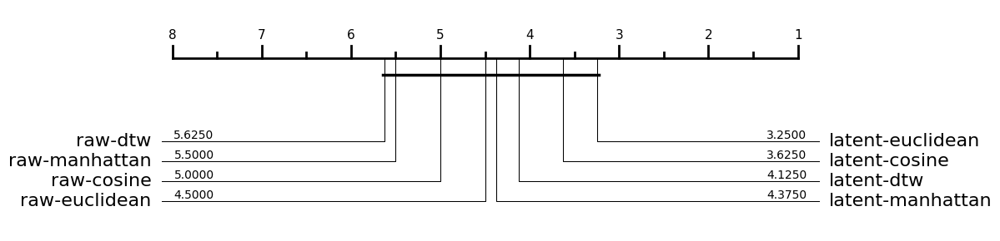

In [11]:
# Load validation.csv
df = pd.read_csv("results/validation.csv")

# Build full method names and extract MSE values
methods = []
mse_data = {}
col_map = {"raw": "test_mse_raw", "latent": "test_mse_lat"}  # <- fix here

for mode in ["raw", "latent"]:
    col_src = col_map[mode]
    for metric in df["metric"].unique():
        col_name = f"{mode}-{metric}"
        methods.append(col_name)
        mask = df["metric"] == metric
        mse_data[col_name] = df.loc[mask, col_src].values

# Use dataset names as task index
tasks = df["dataset"].unique()
ordered = pd.DataFrame(index=tasks)
for method in methods:
    ordered[method] = mse_data[method]

# Convert to numpy for aeon
scores = ordered.values

# Plot the CD diagram
ax = fig.add_subplot(111)
plot_critical_difference(
    scores,
    methods,
    lower_better=True,
    test="wilcoxon",
    correction="holm",
    alpha=0.05,
    width=10,
    textspace=2.0,
    reverse=True
)
ax.set_title("Critical Difference Diagram: Raw vs. Latent (All Metrics)")
plt.tight_layout()
plt.show()

### Test 1.2: Win Rate Analysis

For each metric, we compute the win-rate as the fraction of windows where the latent-space model outperforms the raw model . A win-rate above 50% indicates more frequent wins for the latent model. This analysis complements MSE results to explore whether performance gains arise from consistent small wins or a few large ones.

In [12]:
print(f"Bottleneck size: {latent_dim}")

df_dis['raw_error'] = (df_dis['y_pred_raw'] - df_dis['y_true'])**2
df_dis['lat_error'] = (df_dis['y_pred_lat'] - df_dis['y_true'])**2
df_dis['winner'] = np.where(df_dis['lat_error'] < df_dis['raw_error'],
                            'latent', 'raw')

# Count wins among disagreements
win_counts = (
    df_dis
    .groupby(['dataset','metric','winner'])
    .size()
    .unstack(fill_value=0)
    .rename(columns={'raw':'raw_wins','latent':'latent_wins'})
)

# Compute win‐rates (conditional on disagreement)
win_rates = win_counts.div(win_counts.sum(axis=1), axis=0) \
                      .rename(columns={'raw_wins':'raw_win_rate',
                                       'latent_wins':'latent_win_rate'})

# Merge rates into the summary table
df_full = (
    df_sum
    .merge(win_rates.reset_index(), on=['dataset','metric'], how='left')
    .fillna(0)
    .assign(
        same_decision_rate = 1 - df_sum['disagreement_rate']
    )
)

# Display results
display(
    df_full[[
        'dataset','metric',
        'raw_win_rate','latent_win_rate','same_decision_rate'
    ]]
)

# Save for later
win_rates.to_csv("results/win_rates.csv", index=False)

Bottleneck size: 2


,dataset,metric,raw_win_rate,latent_win_rate,same_decision_rate
0,Temperatures,dtw,0.458839,0.541161,0.179402
1,Temperatures,euclidean,0.500855,0.499145,0.352159
2,Temperatures,cosine,0.505848,0.494152,0.242525
3,Temperatures,manhattan,0.481788,0.518212,0.331118
4,Births,dtw,0.445146,0.554854,0.302697
5,Births,euclidean,0.483744,0.516256,0.441387
6,Births,cosine,0.458537,0.541463,0.210237
7,Births,manhattan,0.482176,0.517824,0.413319
8,SolarPower,dtw,0.498824,0.501176,0.181906
9,SolarPower,euclidean,0.494048,0.505952,0.353224


#### Test 1.2b: weighted win rates

To complement the unweighted win-rate analysis, we compute weighted win rates that account for the magnitude of prediction errors. For each window, we calculate the mean squared error (MSE) for both the latent and raw models, and assign a weight equal to the larger of the two errors. The “winner” for each window is determined based on which model yields the lower MSE. We then sum these weights separately for the latent and raw models across all windows and compute each model’s share of the total weight, yielding a weighted win rate. 

This approach emphasizes not just how often a model wins, but how significant its wins are—highlighting whether improvements arise from consistent small gains or occasional large differences.

In [13]:
print(f"Bottleneck size: {latent_dim}")

# Compute per-window errors and weights
df_dis['mse_raw']    = (df_dis['y_pred_raw']   - df_dis['y_true'])**2
df_dis['mse_latent'] = (df_dis['y_pred_lat']   - df_dis['y_true'])**2
df_dis['weight']     = df_dis[['mse_raw','mse_latent']].max(axis=1)

# --- 2. Determine per-window “winner” ---
df_dis['winner'] = np.where(
    df_dis['mse_latent'] < df_dis['mse_raw'],
    'latent', 'raw'
)

# Sum weights by dataset, metric, and winner
weight_sums = (
    df_dis
    .groupby(['dataset','metric','winner'])['weight']
    .sum()
    .unstack(fill_value=0)
    .rename(columns={'raw':'raw_weight','latent':'latent_weight'})
)

# Compute weighted win‐rates
weighted_win_rates = (
    weight_sums
    .div(weight_sums.sum(axis=1), axis=0)
    .rename(columns={
        'raw_weight':    'raw_weighted_win_rate',
        'latent_weight': 'latent_weighted_win_rate'
    })
)

# Merge into the summary and compute same_decision_rate
df_full = (
    df_sum
    .merge(weighted_win_rates.reset_index(), on=['dataset','metric'], how='left')
    .assign(same_decision_rate = 1 - df_sum['disagreement_rate'])
)

# Save
display(df_full[[
    'dataset','metric',
    'raw_weighted_win_rate',
    'latent_weighted_win_rate',
    'same_decision_rate'
]])

weighted_win_rates.to_csv("results/weighted_win_rates.csv")

Bottleneck size: 2


,dataset,metric,raw_weighted_win_rate,latent_weighted_win_rate,same_decision_rate
0,Temperatures,dtw,0.441240,0.558760,0.179402
1,Temperatures,euclidean,0.500957,0.499043,0.352159
2,Temperatures,cosine,0.491268,0.508732,0.242525
3,Temperatures,manhattan,0.431787,0.568213,0.331118
4,Births,dtw,0.427888,0.572112,0.302697
5,Births,euclidean,0.487360,0.512640,0.441387
6,Births,cosine,0.527960,0.472040,0.210237
7,Births,manhattan,0.487480,0.512520,0.413319
8,SolarPower,dtw,0.502634,0.497366,0.181906
9,SolarPower,euclidean,0.484439,0.515561,0.353224


### Test 1.3: Neighbor-Set Overlap

For each window $w$, let $N_{\mathrm{raw}}(w)$ and $N_{\mathrm{lat}}(w)$ be its top-$k$ forecasters under raw vs. latent distances. Define the Jaccard index

$$
J(w) \;=\; \frac{\lvert N_{\mathrm{raw}}(w)\,\cap\,N_{\mathrm{lat}}(w)\rvert}{\lvert N_{\mathrm{raw}}(w)\,\cup\,N_{\mathrm{lat}}(w)\rvert},
$$

and the mean overlap

$$
\bar J \;=\; \frac{1}{W}\sum_{w=1}^W J(w),
$$

where $W$ is the number of test windows.

**Interpretation**  
- $\bar J \ge 0.8$: forecaster choice largely preserved  
- $0.5 \le \bar J < 0.8$: moderate reshaping  
- $\bar J < 0.5$: fundamentally different forecaster choices  


In [14]:
# Load the neighbor‐sets CSV
df_nei = pd.read_csv("results/neighbor_sets.csv")

# Parse the stored strings into Python lists
def parse_list(s):
    items = s.strip("[]").split(",")
    return [item.strip().strip("'\"") for item in items if item.strip()]

df_nei["raw_neighbors"] = df_nei["raw_neighbors"].apply(parse_list)
df_nei["lat_neighbors"] = df_nei["lat_neighbors"].apply(parse_list)

# Compute Jaccard index for each window
def jaccard(a, b):
    A, B = set(a), set(b)
    return len(A & B) / len(A | B) if (A | B) else 0.0

df_nei["jaccard"] = df_nei.apply(
    lambda row: jaccard(row["raw_neighbors"], row["lat_neighbors"]),
    axis=1
)

# Aggregate average overlap per dataset and metric
jaccard_summary = (
    df_nei
    .groupby(["dataset", "metric"])["jaccard"]
    .mean()
    .reset_index()
    .rename(columns={"jaccard": "avg_jaccard_overlap"})
)

# Reorder metrics
metric_order = ["dtw", "euclidean", "cosine", "manhattan"]
jaccard_summary["metric"] = pd.Categorical(
    jaccard_summary["metric"], categories=metric_order, ordered=True
)
jaccard_summary = jaccard_summary.sort_values(["dataset", "metric"])

# Display
print("Average Jaccard Overlap by Dataset & Metric (ordered):")
print(jaccard_summary.to_string(index=False))

Average Jaccard Overlap by Dataset & Metric (ordered):
     dataset    metric  avg_jaccard_overlap
 Air Quality       dtw             0.353865
 Air Quality euclidean             0.559913
 Air Quality    cosine             0.369498
 Air Quality manhattan             0.543169
      Births       dtw             0.379158
      Births euclidean             0.548026
      Births    cosine             0.342653
      Births manhattan             0.523789
ExchangeRate       dtw             0.466151
ExchangeRate euclidean             0.601024
ExchangeRate    cosine             0.233855
ExchangeRate manhattan             0.588479
  SolarPower       dtw             0.304086
  SolarPower euclidean             0.439543
  SolarPower    cosine             0.320999
  SolarPower manhattan             0.452136
Temperatures       dtw             0.312742
Temperatures euclidean             0.433456
Temperatures    cosine             0.357901
Temperatures manhattan             0.401950
    Treasury       dt

## RQ2: Cluster-Based Latent Selection
Model selection is performed using nearest latent cluster centers instead of full RoCs. For each test window, the closest cluster center (per metric) is used to select the forecasting model. Inference time and test MSE are recorded.


### Test 2.1: Forecasting MSE Comparison

Again here we compare one-step-ahead forecasting error (MSE) when selecting forecaster with the full RoC versus the cluster centers computer earlier using the same three distance metrics: Euclidean, Manhattan, Cosine and DTW.

In [15]:
# Load previously computed summary for raw vs. latent
df_prev = pd.read_csv("results/validation.csv")

summary_list = []

print(f"Bottleneck size: {latent_dim}")
for ds_name, DS, length, window_size in ts_configs:
    print(f"\n=== Dataset: {ds_name} ===")

    # rebuild splits
    ts = DS(length=length)
    X_train, y_train, X_val, y_val, X_test, y_test = windowing(ts.data, window_size)

    # Load forecasters and AE
    ae          = loaded[ds_name]["ae"]
    forecasters = loaded[ds_name]["forecasters"]
    n_windows   = len(X_test)

    for metric in metrics_list:
        # ---- LATENT inference (cluster-center lookup) ----
        t0 = time.perf_counter()
        lat_preds = []
        for w in X_test:
            # encode window
            with torch.no_grad():
                q = ae.encode(w).cpu()

            best_name, best_dist = None, float("inf")
            for name, model in forecasters.items():
                for center in model.centers["latent"]:
                    d = compute_distance(q, center, metric=metric)
                    if d < best_dist:
                        best_dist, best_name = d, name

            lat_preds.append(forecasters[best_name].predict(w))

        time_cluster = time.perf_counter() - t0
        mse_cluster  = mean_squared_error(y_test, lat_preds)

        # fetch standard latent‐based results
        prev_row      = df_prev[(df_prev['dataset']==ds_name)&(df_prev['metric']==metric)].iloc[0]
        mse_standard_lat  = prev_row['test_mse_lat']
        mse_raw_lat  = prev_row['test_mse_raw']
        time_standard_lat = prev_row['time_lat']

        # compute delta and print
        delta = mse_cluster - mse_standard_lat
        sign  = "+" if delta > 0 else "–"
        print(
            f"[{metric:^9}] "
            f"cluster MSE={mse_cluster:.4f}@{time_cluster:.2f}s | "
            f"%‐improvement(vs. full lat RoC): {1 - mse_cluster/mse_standard_lat:.2%} | "
            f"%‐improvement(vs. full raw RoC): {1 - mse_cluster/mse_raw_lat:.2%}"
        )

        summary_list.append({
            "dataset":       ds_name,
            "metric":        metric,
            "cluster_mse":   mse_cluster,
            "time_cluster":  time_cluster,
        })

# tabulate and save
df_sum = pd.DataFrame(summary_list)
df_sum.to_csv("results/cluster.csv", index=False)

Bottleneck size: 2

=== Dataset: Temperatures ===
[   dtw   ] cluster MSE=0.3515@4.68s | %‐improvement(vs. full lat RoC): -4.91% | %‐improvement(vs. full raw RoC): 3.05%
[euclidean] cluster MSE=0.3588@3.18s | %‐improvement(vs. full lat RoC): -3.65% | %‐improvement(vs. full raw RoC): -2.62%
[ cosine  ] cluster MSE=0.3299@3.45s | %‐improvement(vs. full lat RoC): 3.04% | %‐improvement(vs. full raw RoC): 5.66%
[manhattan] cluster MSE=0.3433@3.01s | %‐improvement(vs. full lat RoC): -3.78% | %‐improvement(vs. full raw RoC): 3.83%

=== Dataset: Births ===
[   dtw   ] cluster MSE=0.3551@9.13s | %‐improvement(vs. full lat RoC): -28.09% | %‐improvement(vs. full raw RoC): -7.53%
[euclidean] cluster MSE=0.3272@4.48s | %‐improvement(vs. full lat RoC): -35.96% | %‐improvement(vs. full raw RoC): -33.73%
[ cosine  ] cluster MSE=0.3112@5.86s | %‐improvement(vs. full lat RoC): -32.67% | %‐improvement(vs. full raw RoC): -36.05%
[manhattan] cluster MSE=0.3181@4.39s | %‐improvement(vs. full lat RoC): -33.1

### Test 2.2: Visualization

Four random test windows are encoded using the autoencoder, then matched to the closest RoC entry across all models based on a distance metric. The nearest latent cluster center within the selected model is identified and decoded back to input space as well as the nearest raw center. The original window and its decoded prototype are plotted to illustrate how well the chosen latent representation captures the input structure.

Processing dataset: Temperatures


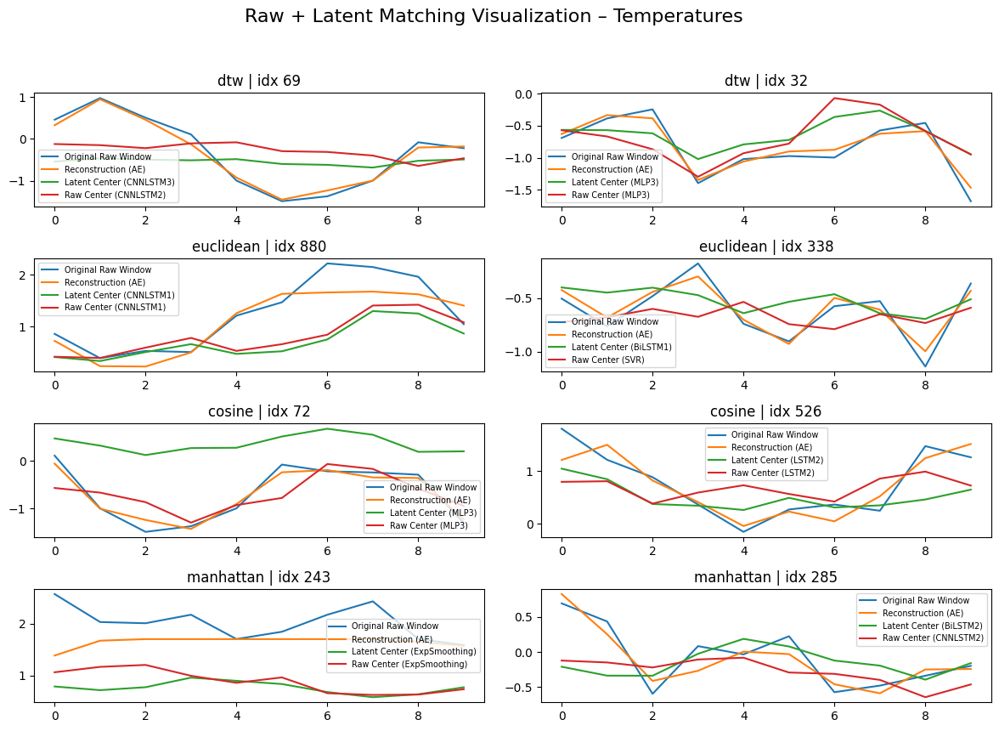

Processing dataset: Births


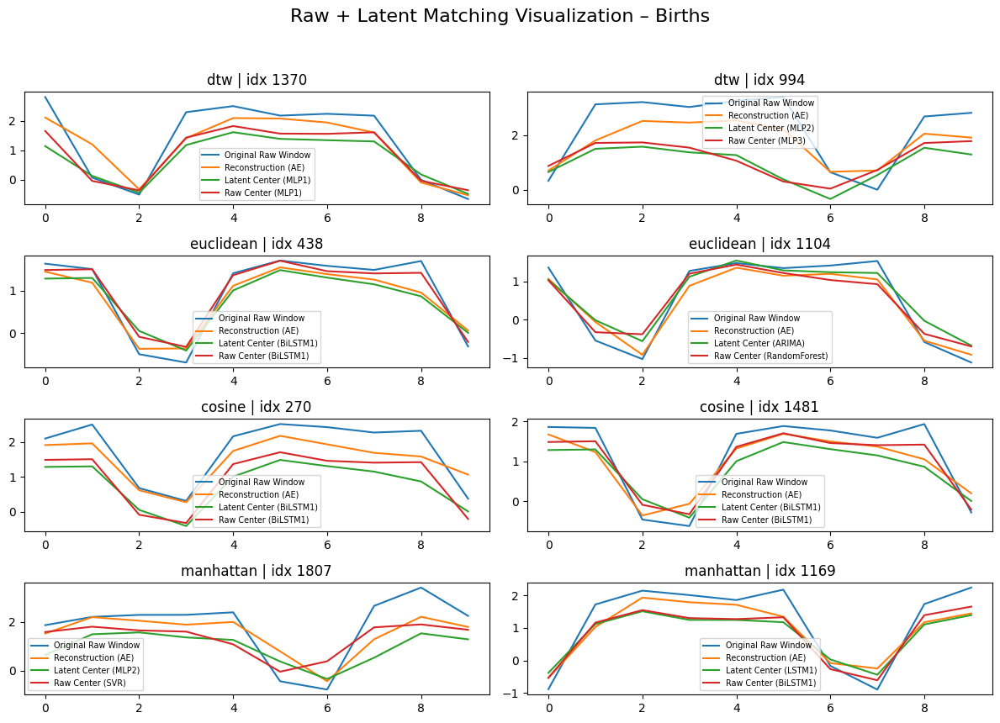

Processing dataset: SolarPower


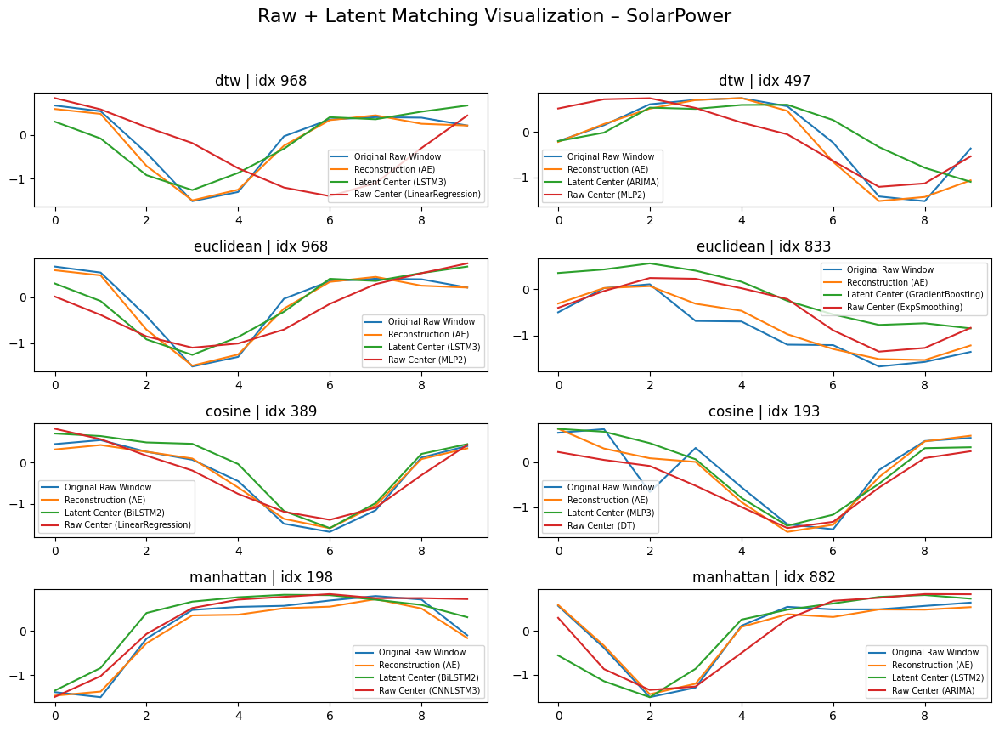

Processing dataset: WindPower


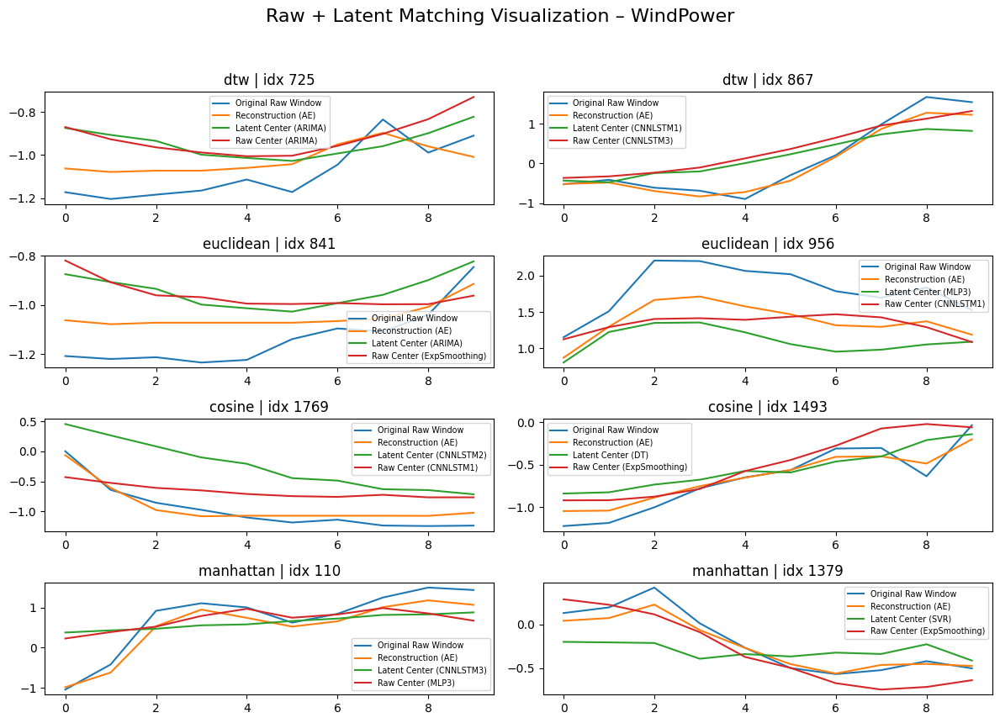

Processing dataset: ExchangeRate


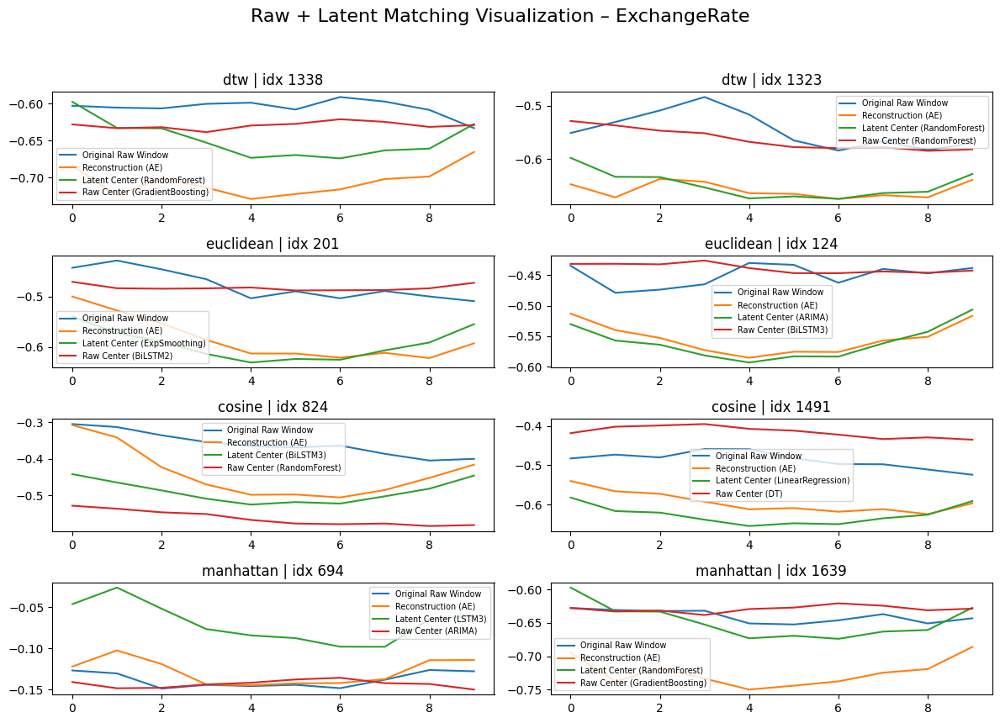

Processing dataset: Treasury


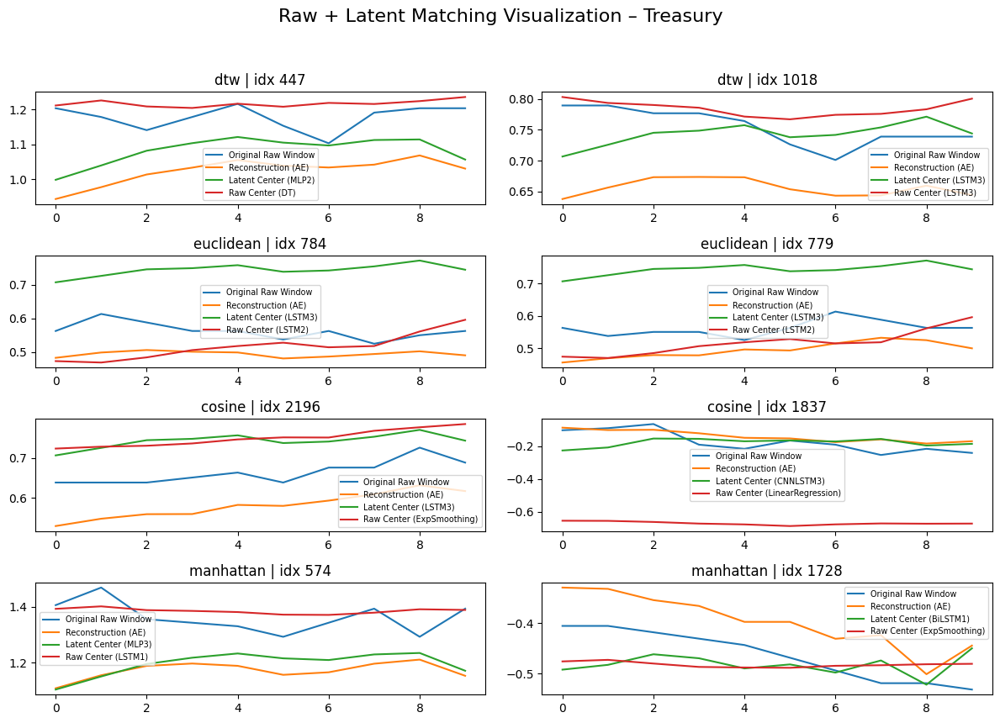

Processing dataset: WindSpeed


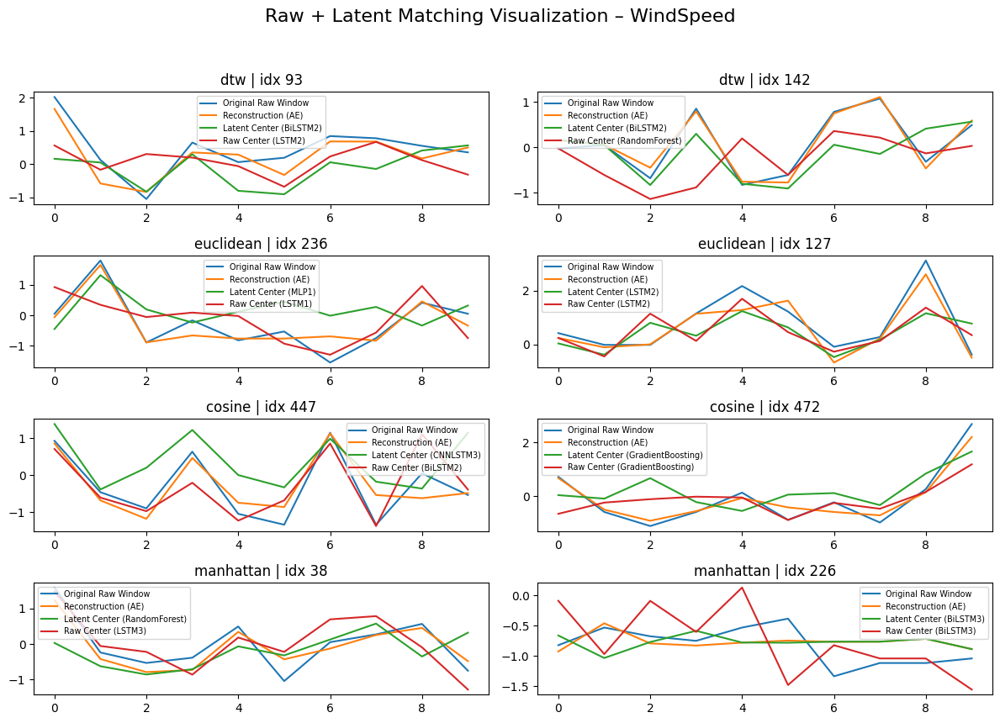

Processing dataset: Air Quality


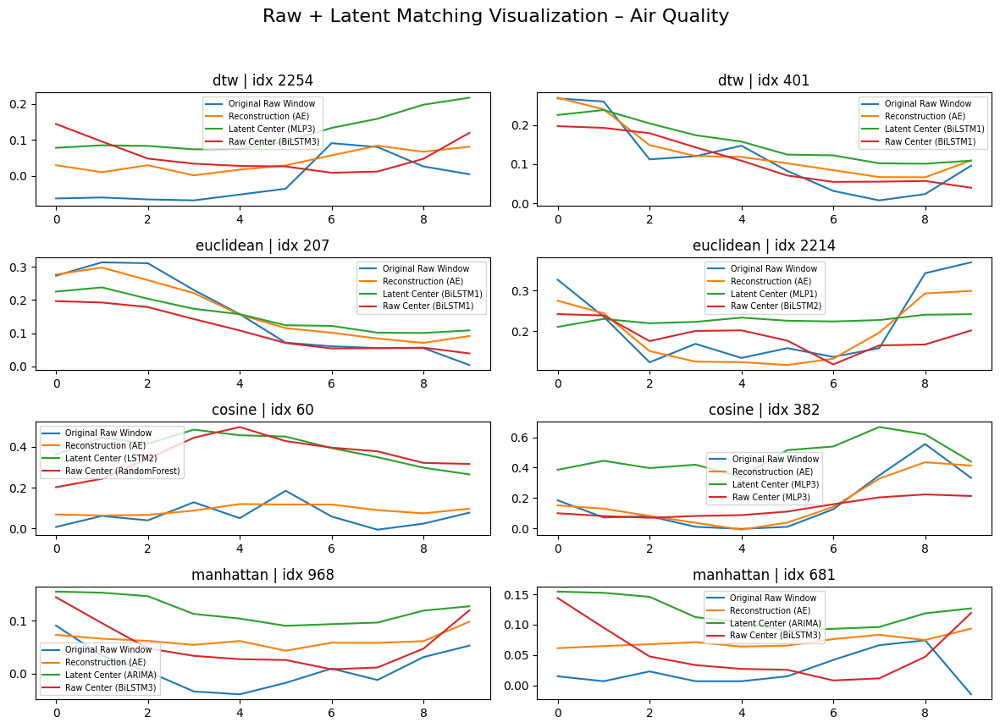

In [16]:
for ds_name, DS, length, window_size in ts_configs:
    print(f"Processing dataset: {ds_name}")

    # Load dataset and create test windows
    ts = DS(length=length)
    _, _, _, _, X_test, _ = windowing(ts.data, window_size)

    # Load AE and forecasters
    ae = loaded[ds_name]['ae']
    forecasters = loaded[ds_name]['forecasters']
    decoder = ae.decoder
    decoder_device = next(decoder.parameters()).device

    # Prepare 3x2 subplot grid: 3 metrics × 2 windows per metric
    fig, axes = plt.subplots(len(metrics_list), 2, figsize=(12, 9))
    axes = axes.reshape(-1, 2)  # Ensure consistent indexing

    for i, metric in enumerate(metrics_list):
        idxs = random.sample(range(len(X_test)), 2)

        for j, idx in enumerate(idxs):
            ax = axes[i, j]
            w = X_test[idx]  # NumPy array

            # Encode the window
            z = ae.encode(w)  # shape: (C, L)
            z_tensor = torch.tensor(z, dtype=torch.float32).unsqueeze(0).to(decoder_device)

            # Reconstruct the window
            with torch.no_grad():
                w_recon = decoder(z_tensor).cpu().numpy().flatten()

            # Find closest latent cluster center
            best_model_lat, best_dist_lat = None, float("inf")
            best_center_lat = None
            for name, model in forecasters.items():
                for center in model.centers["latent"]:
                    c_tensor = center if isinstance(center, torch.Tensor) else torch.tensor(center, dtype=torch.float32)
                    c_tensor = c_tensor.to(decoder_device)
                    d = compute_distance(z_tensor.squeeze(0), c_tensor, metric=metric)
                    if d < best_dist_lat:
                        best_dist_lat = d
                        best_model_lat = name
                        best_center_lat = c_tensor

            # Decode latent center
            with torch.no_grad():
                proto_latent = decoder(best_center_lat.unsqueeze(0)).cpu().numpy().flatten()

            # Find closest raw cluster center
            best_model_raw, best_dist_raw = None, float("inf")
            best_center_raw = None
            for name, model in forecasters.items():
                for center in model.centers["raw"]:
                    center_np = center if isinstance(center, np.ndarray) else center.cpu().numpy()
                    d = compute_distance(w, center_np, metric=metric)
                    if d < best_dist_raw:
                        best_dist_raw = d
                        best_model_raw = name
                        best_center_raw = center_np

            # Plot all
            ax.plot(w, label="Original Raw Window")
            ax.plot(w_recon, label="Reconstruction (AE)")
            ax.plot(proto_latent, label=f"Latent Center ({best_model_lat})")
            ax.plot(best_center_raw, label=f"Raw Center ({best_model_raw})")
            ax.set_title(f"{metric} | idx {idx}")
            ax.legend(fontsize="x-small")

    # Final layout
    fig.suptitle(f"Raw + Latent Matching Visualization – {ds_name}", fontsize=16)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()